In [3]:
import scanpy as sc
import numpy as np
import anndata as ad
import scanpy as sc
#import igraph
#import ALLCools
#from ALLCools.integration.seurat_class import SeuratIntegration
#import scanpy._utils as sc_utils 
#import networkx as nx
#import metis
import pandas as pd
import matplotlib.pyplot as plt
#import scipy.sparse
import anndata
#import os
#from scipy.stats import zscore
import seaborn as sns
import scvelo as scv 

In [42]:
NR1_2= sc.read_h5ad('/mnt/f/spatial/NR1_2.h5ad')

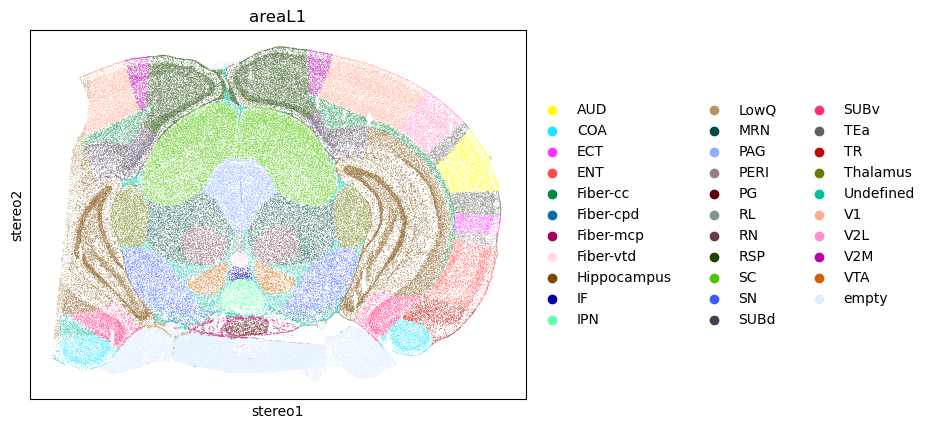

In [43]:
sc.pl.embedding(NR1_2, basis='stereo',color='areaL1')

In [44]:
NR1_2_V1 = NR1_2[NR1_2.obs['areaL1']=='V1']

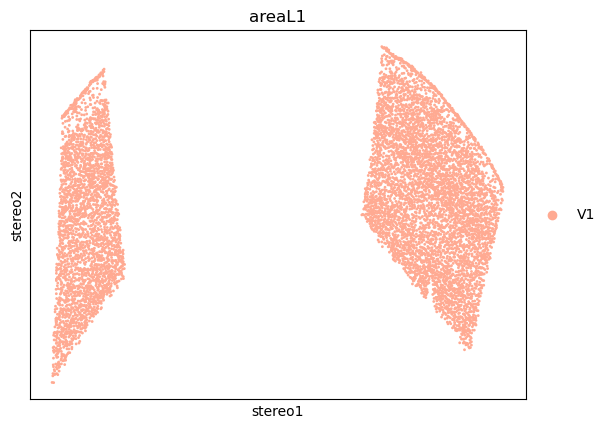

In [7]:
sc.pl.embedding(NR1_2_V1, basis='stereo',color='areaL1')

In [45]:
NR1_2_V1 = NR1_2_V1[NR1_2_V1.obs['left_right']=='right']

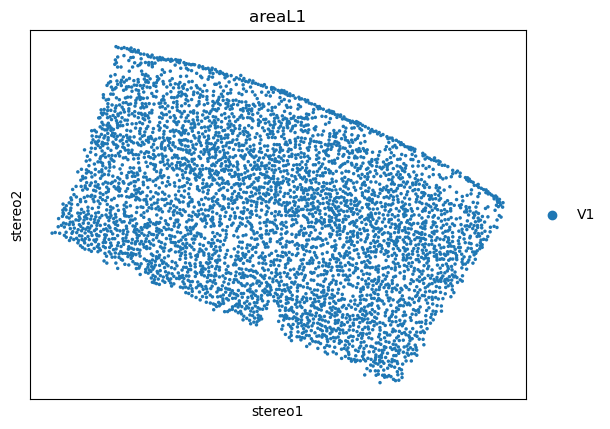

In [366]:
sc.pl.embedding(NR1_2_V1, basis='stereo',color='areaL1')

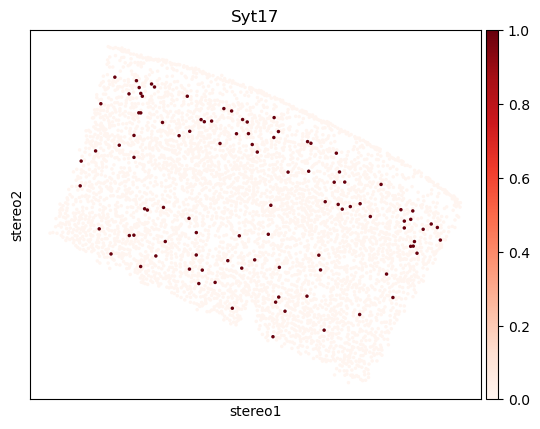

In [280]:
sc.pl.embedding(NR1_2_V1, basis='stereo',color='Syt17',cmap='Reds',vmax=1)

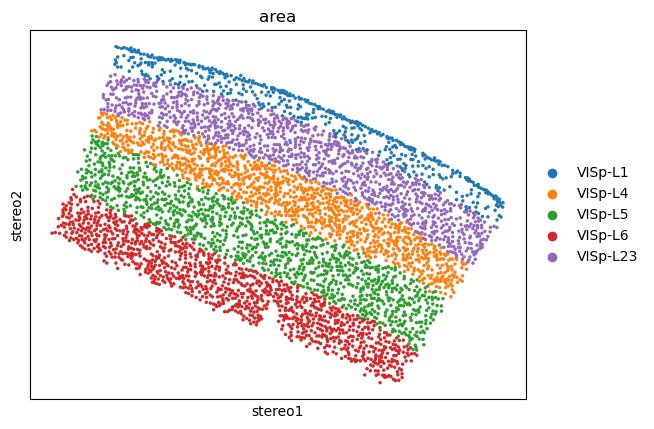

In [12]:
sc.pl.embedding(NR1_2_V1, basis='stereo',color='area')

In [10]:
NR1_2_V1

View of AnnData object with n_obs × n_vars = 4764 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident'
    var: 'gene'
    uns: 'areaL1_colors'
    obsm: 'stereo'

In [39]:
N_V1_Sn = sc.read_h5ad('/mnt/f/RNA_velocity/V1/NR_V1_ann_filter.h5ad')

In [40]:
N_V1_Sn

AnnData object with n_obs × n_vars = 15565 × 22105
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Class_colors', 'Sample_colors', 'Subclass_colors', 'Subtype_colors', 'Type_colors', 'cluster_colors', 'hvg', 'leiden_res_0.80', 'leiden_res_0.80_colors', 'leiden_res_1.00', 'leiden_res_1.00_colors', 'leiden_res_1.20', 'leiden_res_1.20_colors', 'neighbors', 'pca', 'preclass_colors', 'umap'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [46]:
# Consider the common genes
common_genes = np.array(N_V1_Sn.var_names.intersection(NR1_2_V1.var_names))

In [47]:
def get_sparse_from_igraph(graph, weight_attr=None):
    from scipy.sparse import csr_matrix

    edges = graph.get_edgelist()
    if weight_attr is None:
        weights = [1] * len(edges)
    else:
        weights = graph.es[weight_attr]
    if not graph.is_directed():
        edges.extend([(v, u) for u, v in edges])
        weights.extend(weights)
    shape = graph.vcount()
    shape = (shape, shape)
    if len(edges) > 0:
        return csr_matrix((weights, zip(*edges)), shape=shape)
    else:
        return csr_matrix(shape)

In [48]:
def partition_subclasses(adata, n_partitions):
    '''Assign integration partitions as the adata.obs['integration_partion'] column.'''
    adata.obs['integration_partition'] = 'p0'
    
    # Get a sparse matrix of that counts edges between subclasses
    ones = adata.obsp['distances'].copy()
    ones.data = np.ones(len(ones.data))

    g_neighobrs = sc._utils.get_igraph_from_adjacency(ones, directed=True)
    vc = igraph.VertexClustering(g_neighobrs, membership=adata.obs['Subclass'].cat.codes.values)
    cluster_mtx = get_sparse_from_igraph(vc.cluster_graph(combine_edges='sum'), weight_attr='weight')
    
    # Partition the cluster level graph
    G_cluster = nx.from_scipy_sparse_array(cluster_mtx)
    for i in adata.obs['Subclass'].cat.codes.values:
        G_cluster.nodes[i]['weight'] = np.sum(adata.obs['Subclass'] 
                                              == adata.obs['Subclass'].cat.categories[i] )
    G_cluster.graph['node_weight_attr'] = 'weight'
    
    (cut, parts) = metis.part_graph(G_cluster, n_partitions, recursive=False,
                                   tpwgts=[1 / n_partitions] * n_partitions) 
    
    # Assign the partitions
    for i in range(len(parts)):
        mask = (adata.obs['Subclass'] == adata.obs['Subclass'].cat.categories[i])
        adata.obs.loc[mask, 'integration_partition'] = 'p' + str(parts[i])
    
    adata.obs['integration_partition'] = adata.obs['integration_partition'].astype('category')
    
import scipy.sparse
def get_cluster_mean_expression_matrix(adata, cluster_column):
    '''Get a dataframe of mean gene expression of each cluster.'''
    if scipy.sparse.issparse(adata.X):
        X = adata.X.toarray()
    else:
        X = adata.X
   
    cell_exp_mtx = pd.DataFrame(X, index=adata.obs[cluster_column], columns=adata.var.index)    
    return cell_exp_mtx.groupby(by=cluster_column).mean()

def calculate_correlation_matrix(adata, cluster_column):
    '''Calculate gene expression correlations between clusters.'''
    cluster_mean_exp = get_cluster_mean_expression_matrix(adata, cluster_column)
    
    # Initialzie the correlation matrix
    cluster_ids = np.array(cluster_mean_exp.index)
    N_clusters = len(cluster_ids)
    correlation_mtx = pd.DataFrame(np.ones((N_clusters, N_clusters)), index=cluster_ids, columns=cluster_ids)
    
    # Fill the correlation matrix
    for i in range(N_clusters):
        cluster_id1 = cluster_ids[i]
        mean_exps1 = np.array(cluster_mean_exp.loc[cluster_id1])
        
        for j in range(i + 1, N_clusters):
            cluster_id2 = cluster_ids[j]
            mean_exps2 = np.array(cluster_mean_exp.loc[cluster_id2])
            
            r, p = scipy.stats.pearsonr(mean_exps1, mean_exps2)

            correlation_mtx.loc[cluster_id1, cluster_id2] = r
            correlation_mtx.loc[cluster_id2, cluster_id1] = r
            
    return correlation_mtx

def merge_clusters(obs_df, cluster_col, clusters_to_merge):
    merged_cluster_id = sorted(clusters_to_merge)[0]
    obs_df[cluster_col][obs_df[cluster_col].isin(clusters_to_merge)] = merged_cluster_id
    obs_df[cluster_col] = obs_df[cluster_col].cat.remove_unused_categories()

In [59]:
%%time
# Define the integration partitions using the sequencing data
n_partitions = 250


sc.pp.normalize_total(N_V1_Sn, target_sum=1000)



sc.pp.log1p(N_V1_Sn)



sc.pp.scale(N_V1_Sn, zero_center=False)



n_pcs = 100
sc.tl.pca(N_V1_Sn, svd_solver='arpack', n_comps=n_pcs)



sc.pp.neighbors(N_V1_Sn, use_rep='X_pca', n_neighbors=25, n_pcs=n_pcs)


partition_subclasses(N_V1_Sn, n_partitions)


partition_corr_df = calculate_correlation_matrix(N_V1_Sn, 'integration_partition')
p_names, p_n_cells = np.unique(N_V1_Sn.obs['integration_partition'], return_counts=True)
p_smalls = p_names[p_n_cells < 10000]
p_larges = p_names[p_n_cells >= 10000]
partition_corr_df = partition_corr_df.loc[p_smalls, p_larges]

for p1 in p_smalls:

    if partition_corr_df.loc[p1].empty:
        print(f"Warning: partition {p1} has no corresponding large partition.")
        continue 
    

    p2 = partition_corr_df.columns[np.argmax(partition_corr_df.loc[p1])]
    print(f'Merge partitions {p1} and {p2}')
    merge_clusters(N_V1_Sn.obs, 'integration_partition', [p1, p2])

seq_annotation_df = N_V1_Sn.obs.copy()


ValueError: X_harmony does not have enough Dimensions. Provide a Representation with equal or more dimensions than`n_pcs` or lower `n_pcs` 

In [51]:
%%time
# Reload the sequencing data and assign the partitions
N_V1_Sn.obs['integration_partition'] = seq_annotation_df['integration_partition']

N_V1_Sn.obs['Subclass'] = N_V1_Sn.obs['Subclass'].astype('category')
N_V1_Sn.obs['Type'] = N_V1_Sn.obs['Type'].astype('category')

N_V1_Sn = N_V1_Sn[~N_V1_Sn.obs['Type'].isna()]
N_V1_Sn = N_V1_Sn[~N_V1_Sn.obs['Subclass'].isna()]

CPU times: user 150 ms, sys: 71.2 ms, total: 221 ms
Wall time: 218 ms


In [52]:
%%time
# Split the sequencing data for the input of the final round of integration.
# Because imputation is done at this round, all genes are included.

partition_path = '/mnt/f/spatial/V1_integration/NR1_2/partitions/'


partitions = N_V1_Sn.obs['integration_partition'].cat.categories

print('Partition, N_cells, subclasses')


for pn in partitions:

    adata_subset = N_V1_Sn[N_V1_Sn.obs['integration_partition'] == pn]
    

    partition_save_path = partition_path + pn.replace('/', '-').replace(' ', '_') + '/'
    

    os.makedirs(partition_save_path, exist_ok=True)
    

    save_file = partition_save_path + 'adata_seq.h5ad'
    adata_subset.write_h5ad(save_file, compression='gzip')
    

    print(f'{pn}, {adata_subset.shape[0]}, {list(np.unique(adata_subset.obs["Subclass"]))}')


Partition, N_cells, subclasses
p100, 860, ['L6 IT CTX']
p108, 207, ['L6b CTX']
p116, 631, ['L5 IT CTX']
p124, 238, ['L5 NP CTX']
p14, 553, ['Pvalb']
p155, 3376, ['L2/3 IT CTX']
p160, 674, ['Astro']
p161, 34, ['ABC']
p162, 16, ['VLMC']
p170, 279, ['OPC']
p186, 1025, ['Oligo']
p22, 632, ['Sst']
p249, 3044, ['L4/5 IT CTX']
p30, 420, ['Vip']
p6, 307, ['Lamp5']
p61, 1459, ['L5 ET CTX']
p76, 213, ['Microglia']
p92, 1597, ['L6 CT CTX']
CPU times: user 14.7 s, sys: 101 ms, total: 14.8 s
Wall time: 23.6 s


In [53]:
# Merge the datasets
NR_V1_merge = N_V1_Sn.concatenate(NR1_2_V1,
                                    batch_categories=['seq', 'spatial'],
                                    batch_key='modality',
                                    index_unique=None,join='outer')

/tmp/ipykernel_242755/540093128.py:2: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  NR_V1_merge = N_V1_Sn.concatenate(NR1_2_V1,
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [54]:
%%time
# Get the significant PCs
n_pcs = 10
sc.tl.pca(NR_V1_merge, svd_solver='arpack', n_comps=10)

CPU times: user 35.1 s, sys: 593 ms, total: 35.7 s
Wall time: 3.33 s


In [55]:
NR_V1_list = [NR_V1_merge[NR_V1_merge.obs['modality'] == 'seq'],
              NR_V1_merge[NR_V1_merge.obs['modality'] == 'spatial']]

In [56]:
%%time
# Find the integration anchors
integrator = SeuratIntegration()
integrator.find_anchor(NR_V1_list,
                       k_local=None,
                       key_local='X_pca',
                       k_anchor=50,
                       key_anchor='X',
                       dim_red='cca',
                       max_cc_cells=100000,
                       k_score=100,
                       k_filter=None,
                       scale1=False,
                       scale2=False,
                       n_components=n_pcs,
                       n_features=200,
                       alignments=[[[0], [1]]])

Find anchors across datasets.
Run CCA
non zero dims 10
Find Anchors using k=100
Score Anchors
Identified 140734 anchors between datasets 0 and 1.
CPU times: user 2min 58s, sys: 11.8 s, total: 3min 10s
Wall time: 30.4 s


In [57]:
#label transfer
cell_type_col = 'integration_partition'

transfer_results = integrator.label_transfer(
    ref=[0],
    qry=[1],
    categorical_key=[cell_type_col],
    key_dist='X_pca',
    k_weight=100,
    npc=n_pcs)

integrator.save_transfer_results_to_adata(NR_V1_merge, transfer_results)

ValueError: Input contains NaN.

In [97]:
# Assign the transfered labels and the confidence
NR1_2_V1.obs[cell_type_col + '_transfer'] = transfer_results[cell_type_col].idxmax(axis=1).astype('category')
NR1_2_V1.obs[cell_type_col + '_confidence'] = transfer_results[cell_type_col].max(axis=1)

n_transfered = len(np.unique(NR1_2_V1.obs[cell_type_col + '_transfer']))
n_total = len(np.unique(NR_V1_merge.obs[cell_type_col + '_transfer']))
print(f'Transfered {n_transfered}/{n_total} cell types.')

Transfered 18/18 cell types.


In [98]:
# Save the label transfer results for each class
partition_path = '/mnt/f/spatial/V1_integration/partitions/'


partitions = NR1_2_V1.obs[cell_type_col + '_transfer'].unique()

cell_type_col = 'integration_partition'

for pn in partitions:

    adata_subset =NR1_2_V1[NR1_2_V1.obs[cell_type_col + '_transfer'] == pn]
    

    partition_save_path = partition_path + pn.replace('/', '-').replace(' ', '_') + '/'
    

    if not os.path.exists(partition_save_path):
        os.makedirs(partition_save_path, exist_ok=True)
    

    save_file = partition_save_path + 'adata_spatial_integrated.h5ad'
    

    adata_subset.write_h5ad(save_file, compression='gzip')
    

    print(f'Successfully saved for partition {pn} at: {save_file}')


Successfully saved for partition p92 at: /mnt/f/spatial/V1_integration/partitions/p92/adata_spatial_integrated.h5ad
Successfully saved for partition p61 at: /mnt/f/spatial/V1_integration/partitions/p61/adata_spatial_integrated.h5ad
Successfully saved for partition p108 at: /mnt/f/spatial/V1_integration/partitions/p108/adata_spatial_integrated.h5ad
Successfully saved for partition p201 at: /mnt/f/spatial/V1_integration/partitions/p201/adata_spatial_integrated.h5ad
Successfully saved for partition p205 at: /mnt/f/spatial/V1_integration/partitions/p205/adata_spatial_integrated.h5ad
Successfully saved for partition p229 at: /mnt/f/spatial/V1_integration/partitions/p229/adata_spatial_integrated.h5ad
Successfully saved for partition p155 at: /mnt/f/spatial/V1_integration/partitions/p155/adata_spatial_integrated.h5ad
Successfully saved for partition p186 at: /mnt/f/spatial/V1_integration/partitions/p186/adata_spatial_integrated.h5ad
Successfully saved for partition p217 at: /mnt/f/spatial/V1_

In [99]:
%%time
# Correct the PCs using the integration anchors
corrected = integrator.integrate(key_correct='X_pca',
                                 row_normalize=True,
                                 n_components=n_pcs,
                                 k_weight=100,
                                 sd=1,
                                 alignments=[[[0], [1]]])

NR_V1_merge.obsm['X_pca_integrate'] = np.concatenate(corrected)

Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data
CPU times: user 8min 34s, sys: 1min 13s, total: 9min 48s
Wall time: 1min 8s


In [100]:
# Calculate KNN using the integrated PCs
sc.pp.neighbors(NR_V1_merge,use_rep='X_pca_integrate')

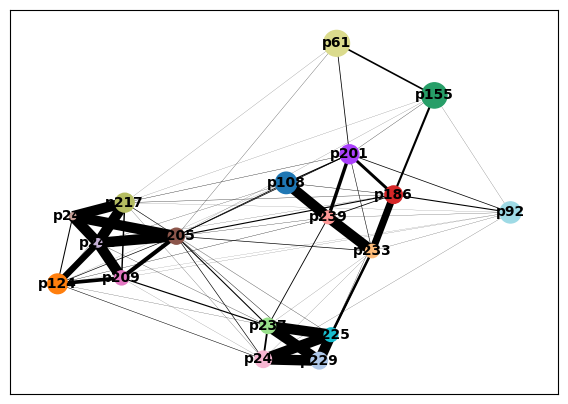

CPU times: user 587 ms, sys: 552 µs, total: 588 ms
Wall time: 603 ms


In [101]:
%%time
# Generate the PAGA plot for the initial arrangement of the UMAP
sc.tl.paga(NR_V1_merge, groups=cell_type_col + '_transfer')
sc.pl.paga(NR_V1_merge, save='_tmp.png')

In [68]:
NR_V1_merge,NR_V1_merge.obs['integration_partition_transfer']

(AnnData object with n_obs × n_vars = 20329 × 27498
     obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality'
     var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
     uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
     obsm: 'X_harmony

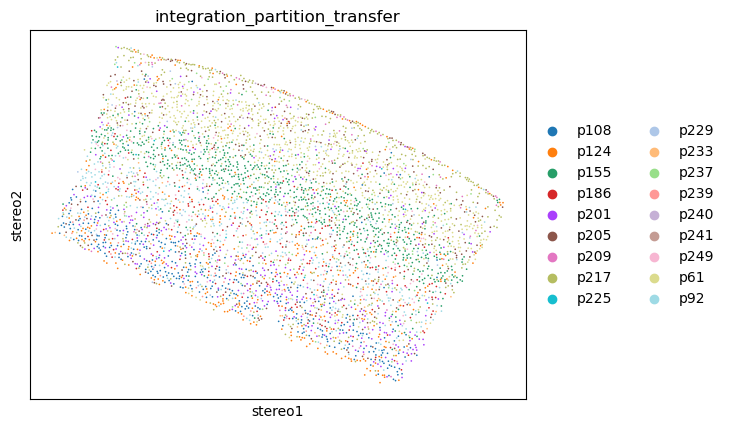

In [83]:
sc.pl.embedding(NR_V1_merge,basis='stereo',color='integration_partition_transfer')

In [ ]:
p108, 1597, ['L6 CT CTX']
p124, 1025, ['Oligo']
p155, 3044, ['L4/5 IT CTX']
p186, 631, ['L5 IT CTX']
p201, 860, ['L6 IT CTX']
p205, 213, ['Microglia']
p209, 279, ['OPC']
p217, 674, ['Astro']
p225, 307, ['Lamp5']
p229, 632, ['Sst']
p233, 238, ['L5 NP CTX']
p237, 420, ['Vip']
p239, 207, ['L6b CTX']
p240, 34, ['ABC']
p241, 16, ['VLMC']
p249, 553, ['Pvalb']
p61, 3376, ['L2/3 IT CTX']
p92, 1459, ['L5 ET CTX']
CPU times: user 15.7 s, sys: 175 ms, total: 15.9 s
Wall time: 23.9 s

In [102]:
subclass_dict={'p108':'L6 CT CTX',
'p209':'OPC',
'p92' :'L5 ET CTX',
'p186' :'L5 IT CTX',
'p201' :'L6 IT CTX',
'p237' :'Vip',
'p225' :'Lamp5',
'p233' :'L5 NP CTX',
'p205' :'Microglia',
'p239' :'L6b CTX',
'p241' :'VLMC',
'p240' :'ABC',
'p229' :'Sst',
'p217' :'Astro',
'p249' :'Pvalb',
'p61'  :'L2/3 IT CTX',
'p155'  :'L4/5 IT CTX',
'p124'  :'Oligo'}

In [103]:
NR_V1_merge.obs['integration_subclass_transfer'] = NR_V1_merge.obs['integration_partition_transfer'].map(subclass_dict)
print(NR_V1_merge.obs[['integration_partition_transfer', 'integration_subclass_transfer']])

                         integration_partition_transfer  \
AAACCCAAGTACTGTC-1-V1_N1                           p249   
AAACCCAAGTTGGAAT-1-V1_N1                           p186   
AAACCCACAGAAATTG-1-V1_N1                           p217   
AAACCCACATACCAGT-1-V1_N1                           p155   
AAACCCAGTCTACATG-1-V1_N1                            p92   
...                                                 ...   
101978                                             p217   
101979                                             p217   
101994                                              p61   
101999                                              p61   
102000                                              p61   

                         integration_subclass_transfer  
AAACCCAAGTACTGTC-1-V1_N1                         Pvalb  
AAACCCAAGTTGGAAT-1-V1_N1                     L5 IT CTX  
AAACCCACAGAAATTG-1-V1_N1                         Astro  
AAACCCACATACCAGT-1-V1_N1                   L4/5 IT CTX  
AAACCC

In [104]:
coembedding_umap_df = NR_V1_merge.obs[[]].copy()
coembedding_umap_df['umap_x'] = NR_V1_merge.obsm['X_umap'][:, 0]
coembedding_umap_df['umap_y'] = NR_V1_merge.obsm['X_umap'][:, 1]
coembedding_umap_df.to_csv('coembedding_umap.csv')

In [ ]:
#Integrate individual partitions

In [105]:
def impute_gene_expression(integrator, adata_list, X_ref, ref=0, qry=1, npc=30, k_weight=30, sd=1,
                           chunk_size=1000, random_state=0):
    data_qry = adata_list[qry].obsm['X_pca']

    anchor, G, D, cum_qry = integrator.find_nearest_anchor(adata_list, data_qry=data_qry, ref=[ref], qry=[qry],
                                                      npc=npc, k_weight=k_weight, sd=sd, random_state=random_state)
    
    if scipy.sparse.issparse(X_ref):
        X_ref = X_ref.toarray()
    
    X_anchor = X_ref[anchor[:, 0]]
    imputed_chunks = []
    
    for chunk_start in np.arange(0, data_qry.shape[0], chunk_size):
        imputed_chunks.append(scipy.sparse.csr_matrix((
                        D[chunk_start:(chunk_start + chunk_size), :, None] *
                        X_anchor[G[chunk_start:(chunk_start + chunk_size)]]
                    ).sum(axis=1).astype(np.float32)))

    return scipy.sparse.vstack(imputed_chunks)

Integrating for partition p108


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 11610 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 2/3 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 387 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


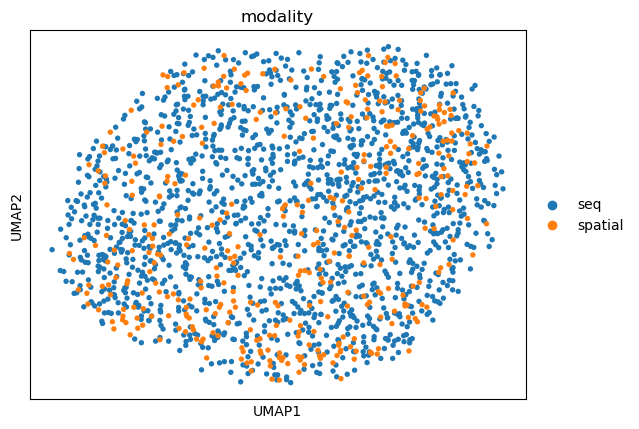

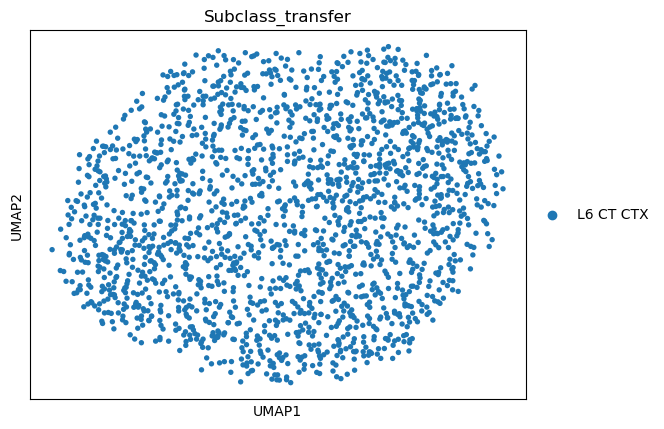

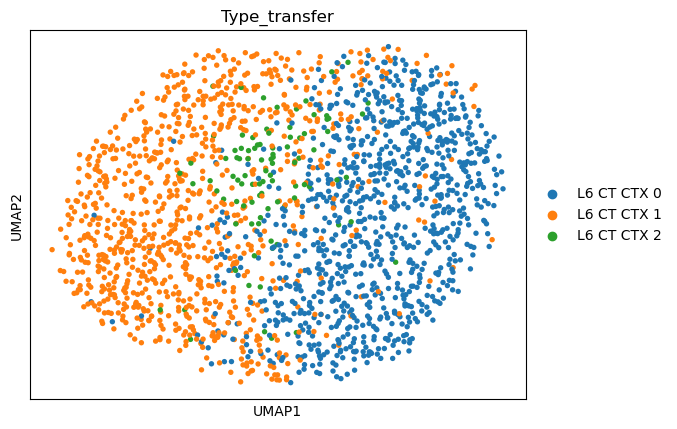

Integrating for partition p124


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 11759 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 2/2 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 392 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


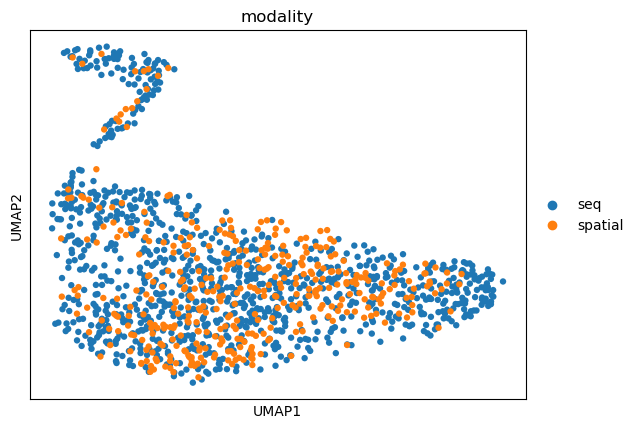

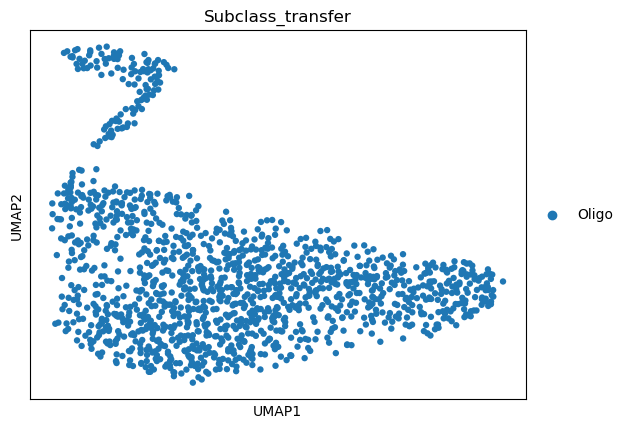

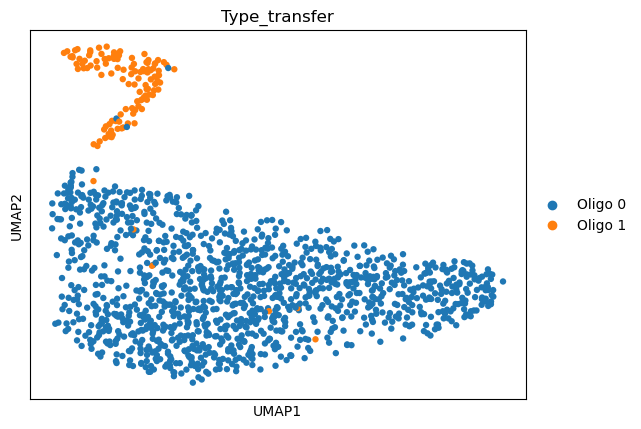

Integrating for partition p155


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 23370 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 2/2 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 779 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


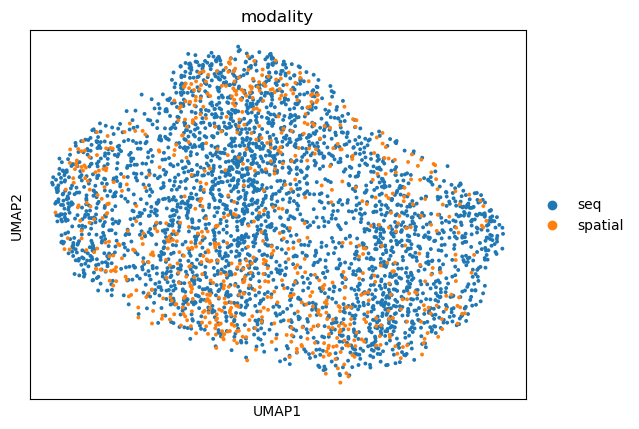

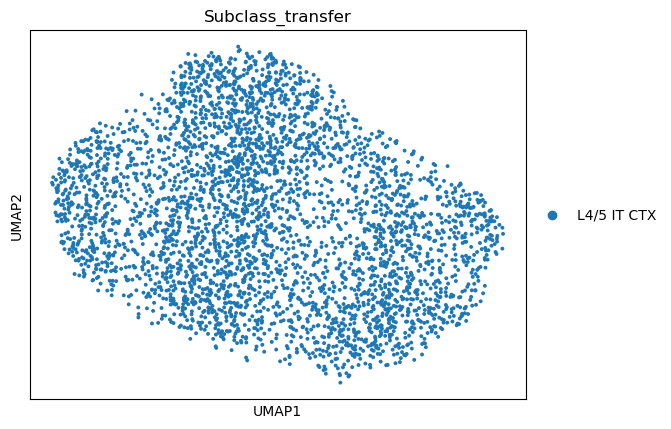

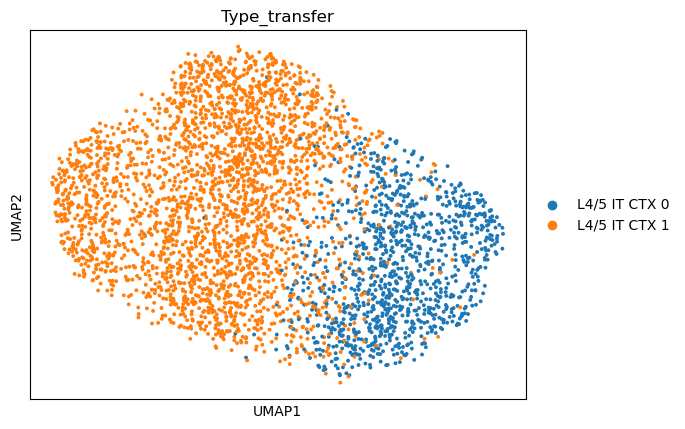

Integrating for partition p186


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 7410 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 2/2 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 247 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


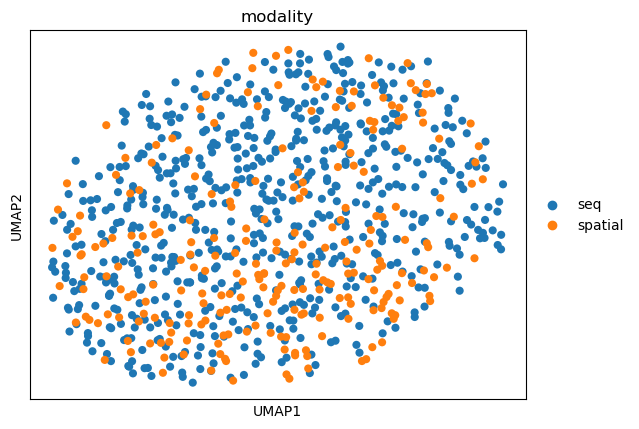

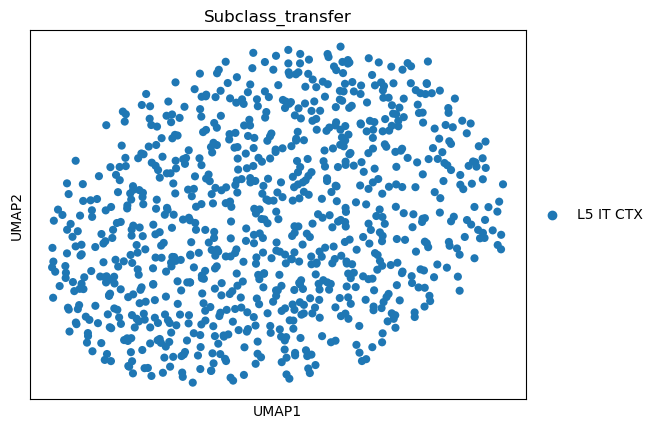

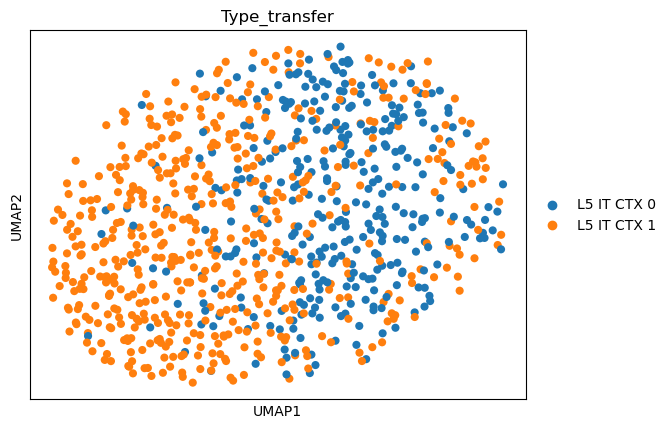

Integrating for partition p201


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 9870 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 2/3 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 329 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


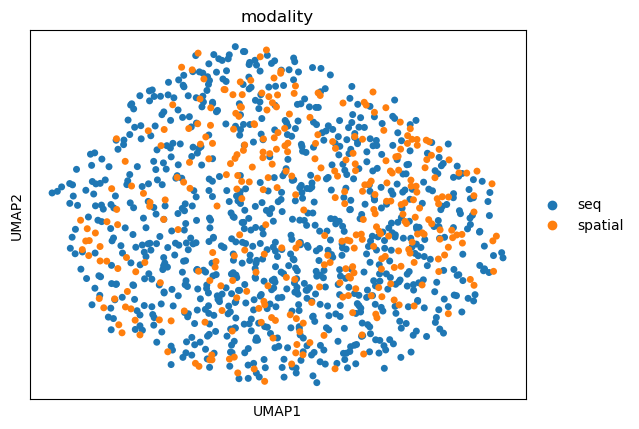

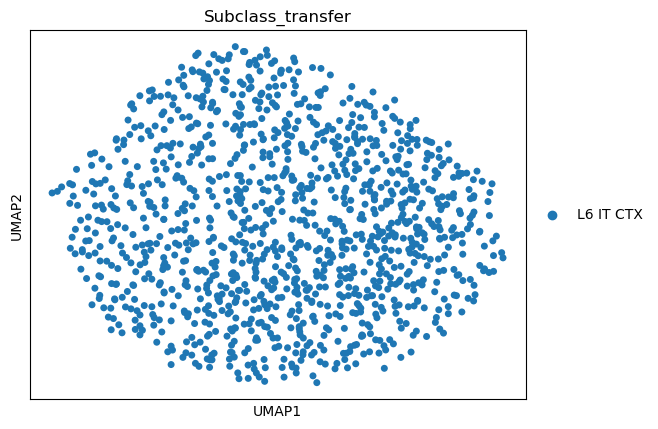

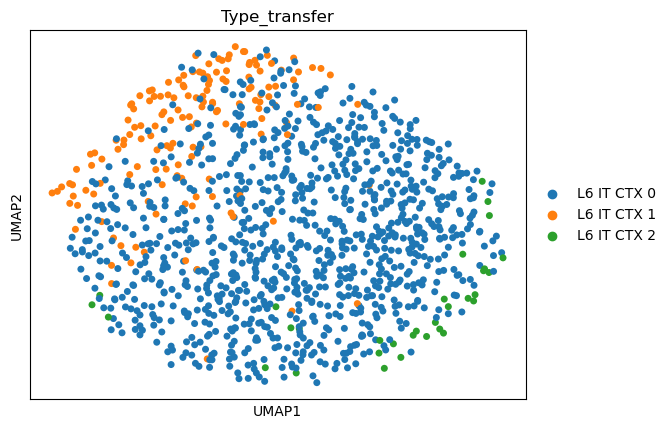

Integrating for partition p205


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 6390 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 405 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


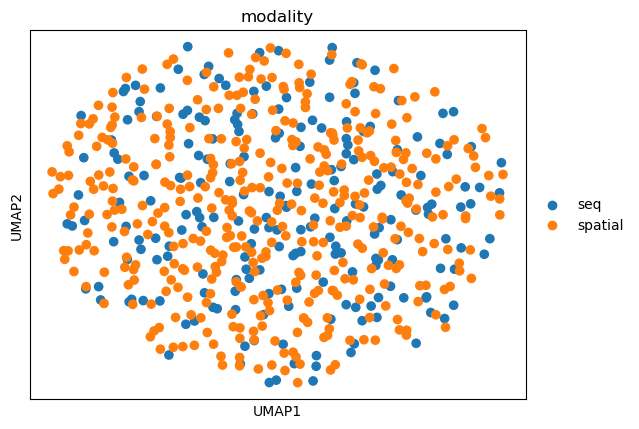

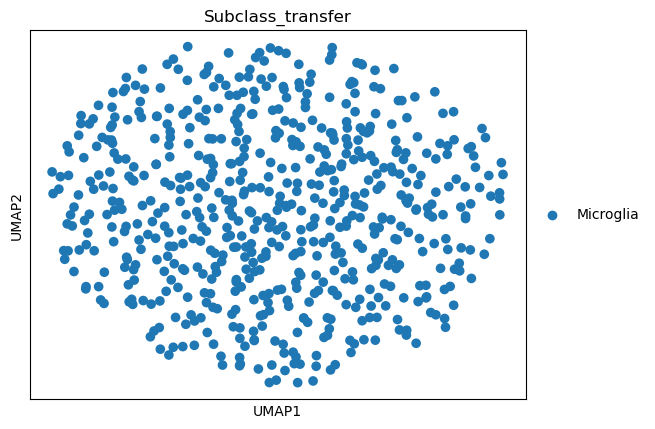

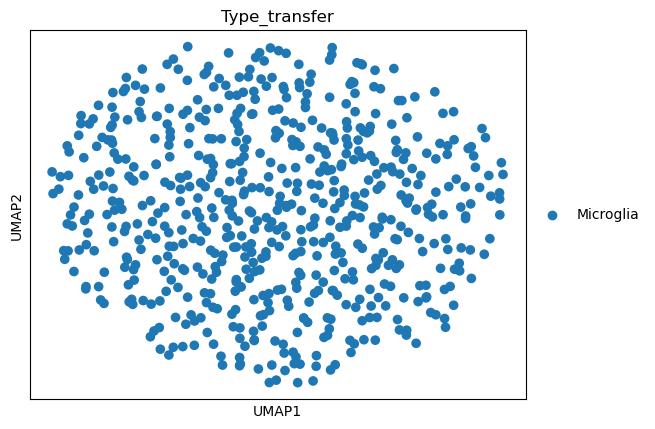

Integrating for partition p209


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=90
Score Anchors
Identified 2760 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 92 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


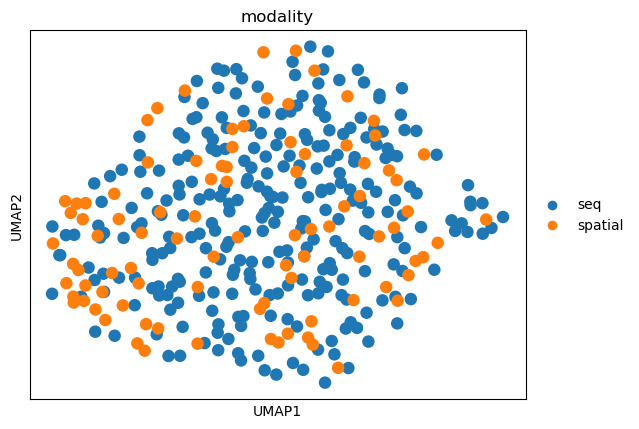

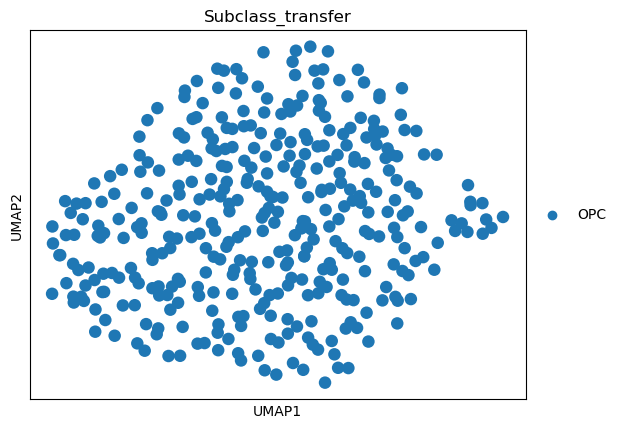

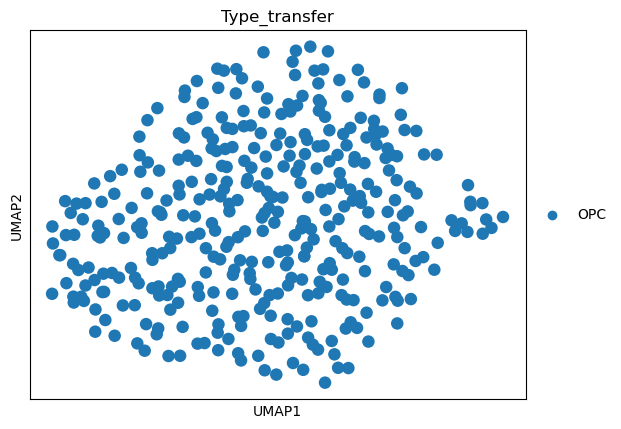

Integrating for partition p217


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 15219 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 518 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


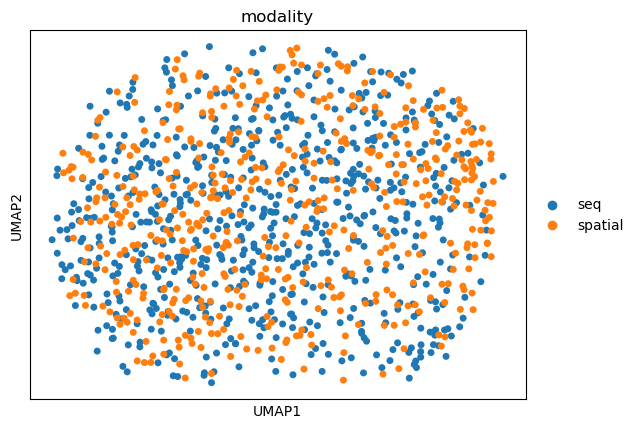

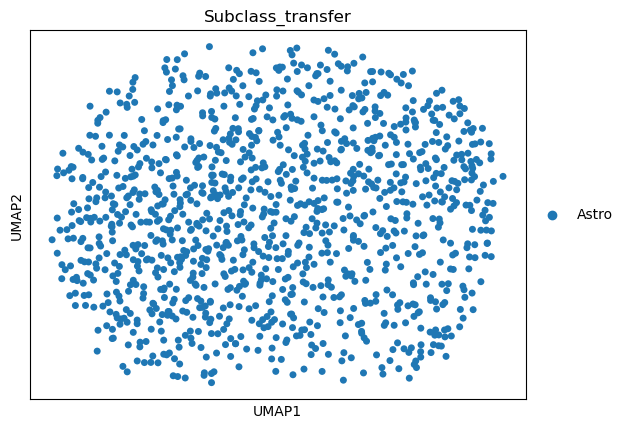

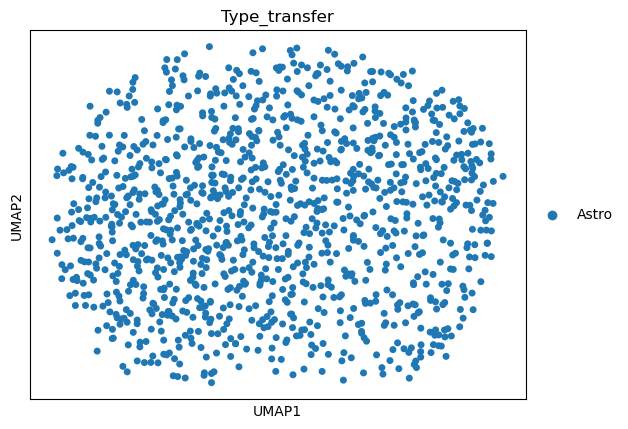

Integrating for partition p229


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=69
Score Anchors
Identified 2130 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 3/4 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 71 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


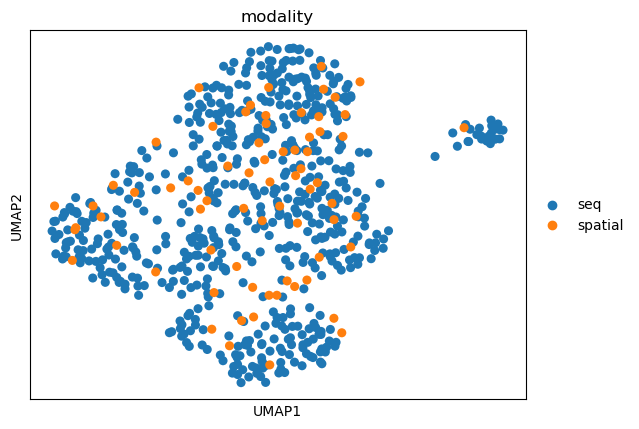

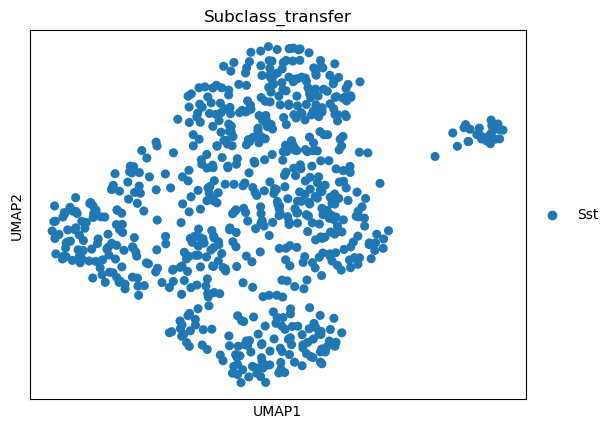

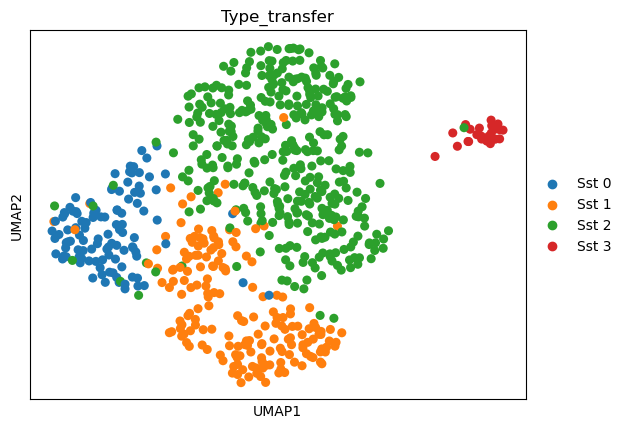

Integrating for partition p233


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=48
Score Anchors
Identified 1500 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 50 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


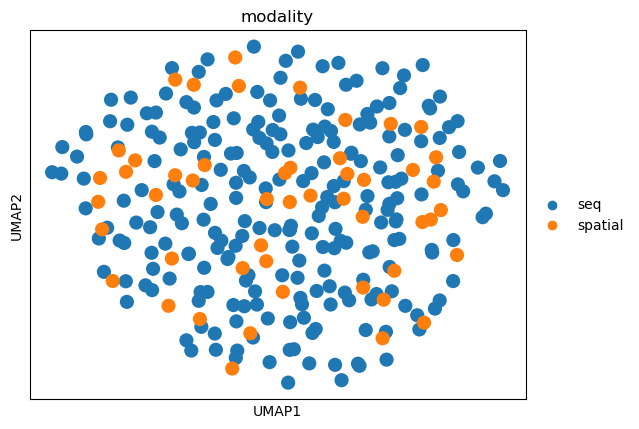

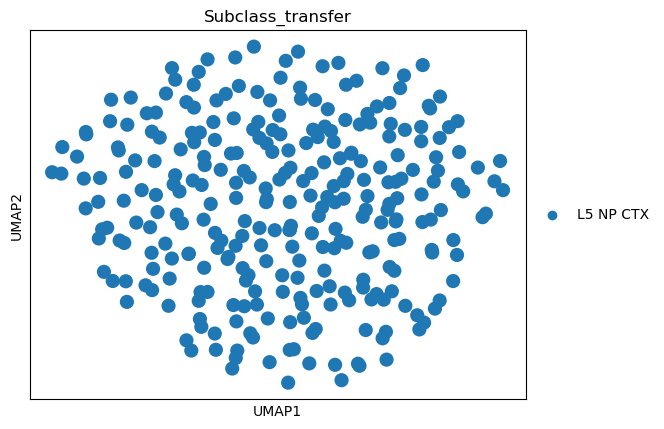

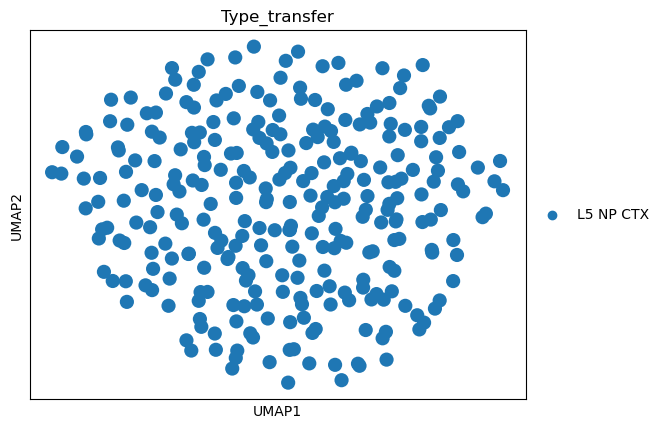

Integrating for partition p237


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=86
Score Anchors
Identified 2640 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 88 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


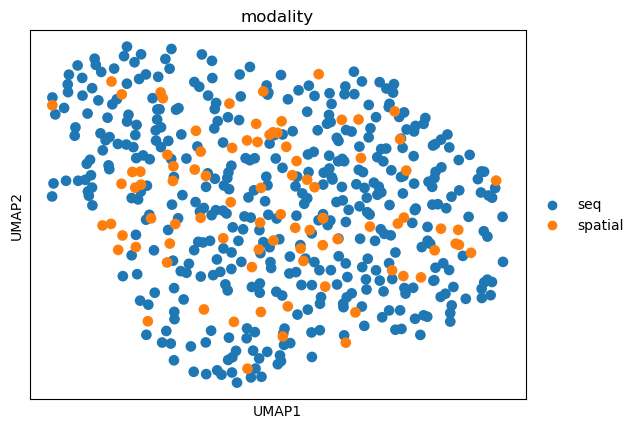

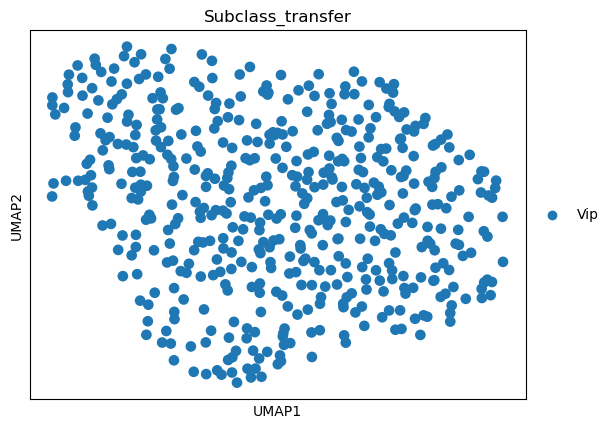

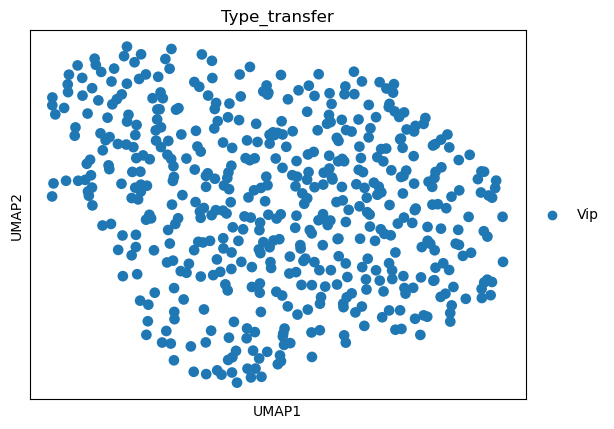

Integrating for partition p239


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=30
Score Anchors
Identified 960 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 1/1 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph
AnnData object with n_obs × n_vars = 32 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean'

/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


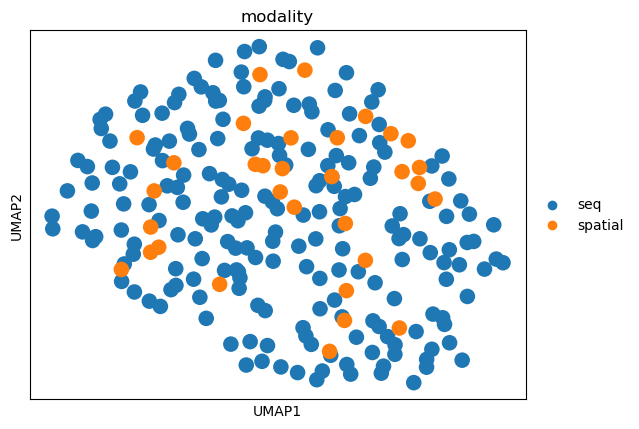

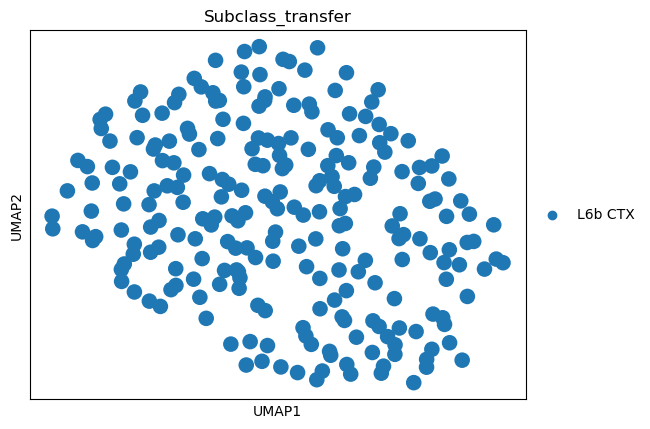

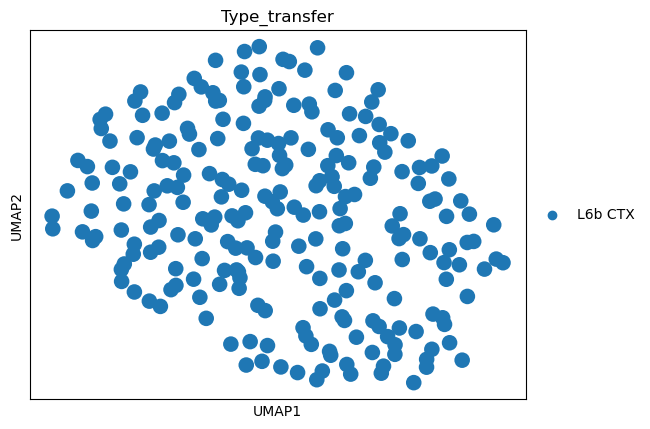

Integrating for partition p249


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 3720 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 2/2 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 124 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


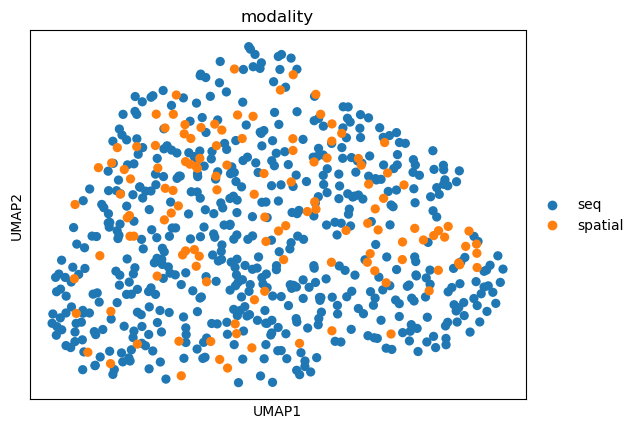

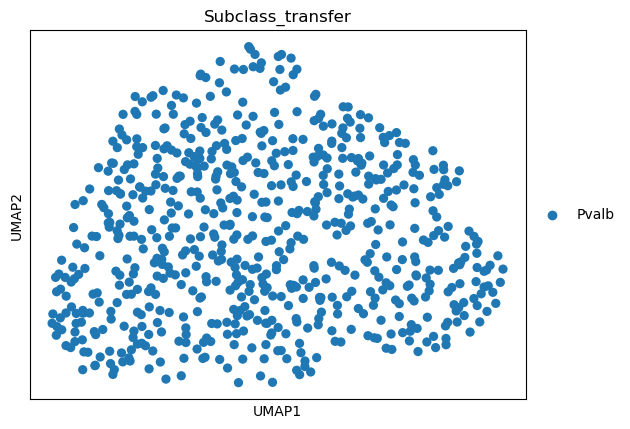

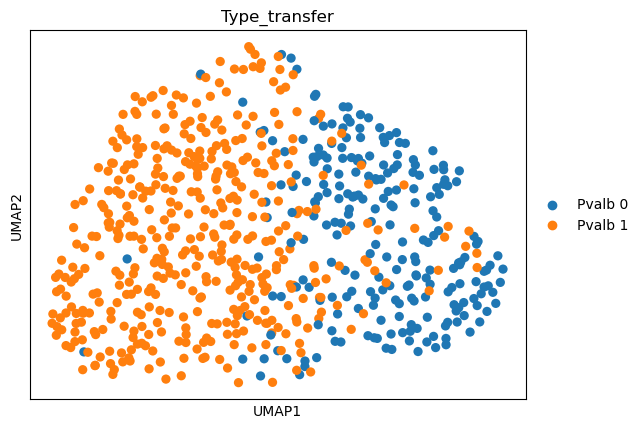

Integrating for partition p61


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 24150 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 3/3 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 805 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


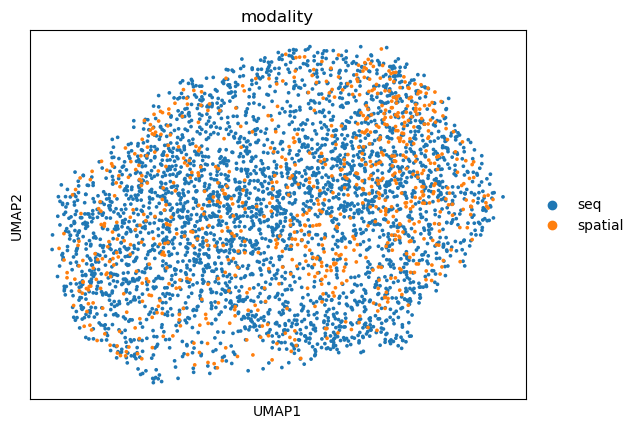

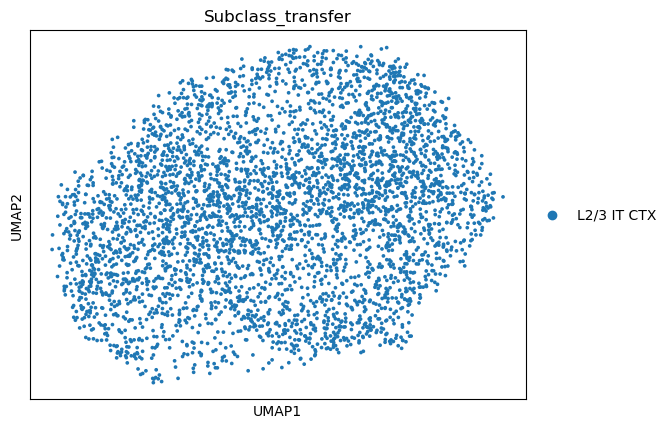

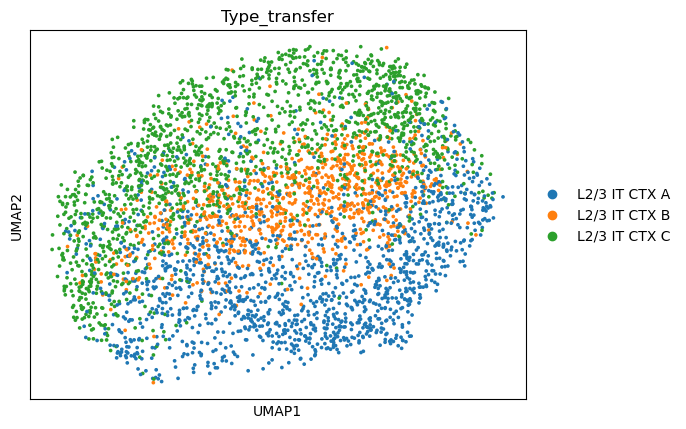

Integrating for partition p92


<timed exec>:46: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/merge.py:1358: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.


Find anchors across datasets.
Run CCA
non zero dims 30
Find Anchors using k=100
Score Anchors
Identified 12360 anchors between datasets 0 and 1.
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Label transfer
Transfered 1/1 Subclass.
Transfered 4/4 Type.
Initialize
Find nearest anchors. k_weight:  30
Normalize graph


/root/anaconda3/lib/python3.10/site-packages/ALLCools/integration/seurat_class.py:657: RuntimeWarning: invalid value encountered in divide
/root/anaconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:402: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.


AnnData object with n_obs × n_vars = 412 × 22105
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    var: 'gene_ids', 'feature_types', 'n_cells-V1_N1', 'highly_variable-V1_N1', 'means-V1_N1', 'dispersions-V1_N1', 'dispersions_norm-V1_N1', 'n_cells-V1_N2', 'highly_variable-V1_N2', 'means-V1_N2', 'dispersions-V1_N2', 'dispersions_norm-V1_N2', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
Merge datasets
[[0], [1]]
Initialize
Find nearest anchors. k_weight:  100
Normalize graph
Transform data


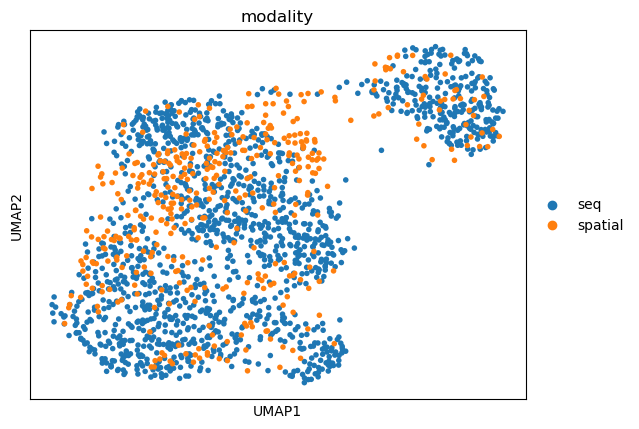

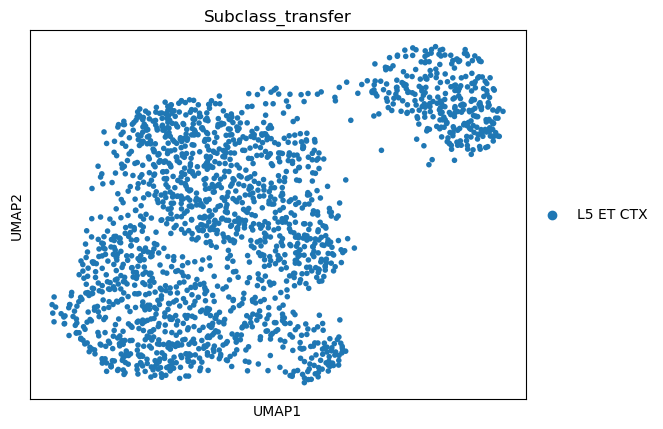

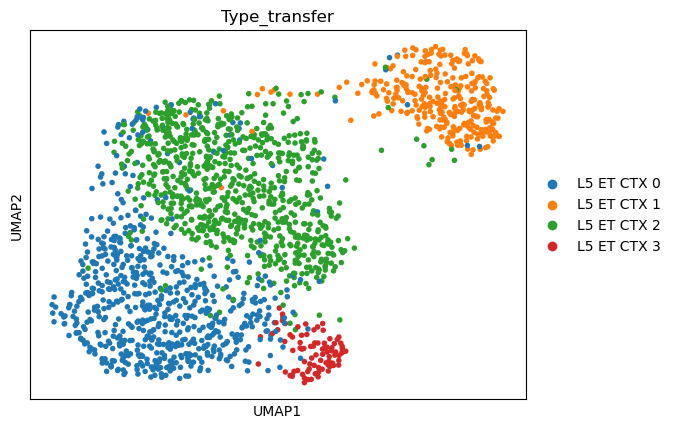

CPU times: user 54min 38s, sys: 3min 45s, total: 58min 23s
Wall time: 25min 48s


In [324]:

%%time

workspace_path = '/mnt/f/spatial/V1_integration/'
partition_path = workspace_path + 'partitions/'
partitions = sorted(os.listdir(partition_path))

for pn in partitions:
    print(f'Integrating for partition {pn}')
    

    integration_path = partition_path + pn + '/'
    input_adata_seq_file = os.path.join(integration_path, 'adata_seq.h5ad')
    input_adata_spatial_file = os.path.join(integration_path, 'adata_spatial_integrated.h5ad')
    

    if not (os.path.exists(input_adata_seq_file) and os.path.exists(input_adata_spatial_file)):
        print(f'Missing input files for partition {pn}. Skipping this integration.')
        continue 
    ## Load and preprocess the data
    adata_seq_raw = sc.read_h5ad(input_adata_seq_file)
    adata_seq = adata_seq_raw.copy()
    adata_spatial_raw = sc.read_h5ad(input_adata_spatial_file)
    adata_spatial = adata_spatial_raw.copy()

    # Consider the common genes
    common_genes = np.array(adata_seq.var_names.intersection(adata_spatial.var_names))
    #adata_seq._inplace_subset_var(common_genes)
    
    # Normalize
    sc.pp.normalize_total(adata_seq, target_sum=1000)
    sc.pp.log1p(adata_seq)
    sc.pp.normalize_total(adata_spatial, target_sum=1000)
    sc.pp.log1p(adata_spatial)
    
    # Select variable genes
    #sc.pp.highly_variable_genes(adata_seq)
    #hv_genes = list(adata_seq.var.index[adata_seq.var['dispersions'] > 0])
    #adata_seq = adata_seq[:, adata_seq.var.index.isin(hv_genes)]
    #adata_spatial = adata_spatial[:, adata_spatial.var.index.isin(hv_genes)]
    #print(f'Use {len(hv_genes)} highly variable genes for integration.')
    
    # Scale the data
    sc.pp.scale(adata_seq)
    sc.pp.scale(adata_spatial)
    
    # Merge the datasets
    adata_merge = adata_seq.concatenate(adata_spatial,
                                    batch_categories=['seq', 'spatial'],
                                    batch_key='modality',
                                    index_unique=None)
     # Select variable genes
    #sc.pp.highly_variable_genes(adata_merge)
    #target_genes=['Syt17','Stard8','Whrn','Rorb','Scnn1a','Syt2','Tle4','Syt6','Ccn2']
    #adata_merge.var['highly_variable'] = (
    #adata_merge.var['highly_variable'] | adata_merge.var_names.isin(target_genes))
    # PCA

    n_pcs = 30
    sc.tl.pca(adata_merge, svd_solver='arpack', n_comps=n_pcs)
    
    adata_list = [adata_merge[adata_merge.obs['modality'] == 'seq'],
                  adata_merge[adata_merge.obs['modality'] == 'spatial']]
    
    ## Integration
    # Find the integration anchors
    integrator = SeuratIntegration()
    integrator.find_anchor(adata_list,
                       k_local=None,
                       key_local='X_pca',
                       k_anchor=30,
                       key_anchor='X',
                       dim_red='cca',
                       max_cc_cells=100000,
                       k_score=100,
                       k_filter=None, #why?
                       scale1=False,
                       scale2=False,
                       n_components=n_pcs,
                       n_features=200,
                       alignments=[[[0], [1]]])
    
    # Label transfer
    cell_type_cols = ['Subclass', 'Type']
    transfer_results = integrator.label_transfer(
        ref=[0],
        qry=[1],
        categorical_key=cell_type_cols,
        key_dist='X_pca',
        k_weight=100,
        npc=n_pcs
    )
    integrator.save_transfer_results_to_adata(adata_merge, transfer_results)
    
    # Assign the transfered labels and the confidence
    for cell_type_col in cell_type_cols:
        adata_spatial_raw.obs[cell_type_col + '_transfer'] = transfer_results[cell_type_col].idxmax(axis=1
                                                                                           ).astype('category')
        adata_spatial_raw.obs[cell_type_col + '_confidence'] = transfer_results[cell_type_col].max(axis=1)
        
        n_transfered = len(np.unique(adata_spatial_raw.obs[cell_type_col + '_transfer']))
        n_total = len(np.unique(adata_merge.obs[cell_type_col + '_transfer']))
        print(f'Transfered {n_transfered}/{n_total} {cell_type_col}.')
    
    # Impute gene expression
    X_imputed = impute_gene_expression(integrator, adata_list, adata_seq_raw.X, 
                                       ref=0, qry=1, npc=n_pcs, chunk_size=5000)
    adata_imputed = anndata.AnnData(X=X_imputed, obs=adata_spatial_raw.obs.copy(), 
                                var=adata_seq_raw.var.copy(), dtype=np.float32)
    print(adata_imputed)


    imputed_data = np.zeros(adata_spatial_raw.shape)


    for i, gene in enumerate(adata_imputed.var_names):
        if gene in adata_spatial_raw.var_names:
           idx = adata_spatial_raw.var_names.get_loc(gene)
           imputed_data[:, idx] = adata_imputed[:, i].X.toarray().flatten()


    adata_spatial_raw.layers['imputed'] = imputed_data
    # Save the label transfer results
    adata_spatial_raw.write_h5ad(os.path.join(integration_path, 'adata_spatial_label_transfer.h5ad'), 
                                 compression='gzip')
    # Create the imputation gene partition table
    gene_partition_df = adata_seq_raw.var.copy()
    gene_partition_df.index.name = 'gene'
    gene_partition_df['gene_partition'] = np.arange(gene_partition_df.shape[0], dtype=int) // 1000
    gene_partition_df.to_csv(os.path.join(integration_path,f'/mnt/f/spatial/V1_integration/partitions/{pn}/gene_partition.csv'))
    
    gene_partitions = np.unique(gene_partition_df['gene_partition'])

    
    ## Co-embedding
    # Correct the PCs using the integration anchors
    corrected = integrator.integrate(key_correct='X_pca',
                                 row_normalize=True,
                                 n_components=n_pcs,
                                 k_weight=100,
                                 sd=1,
                                 alignments=[[[0], [1]]])

    adata_merge.obsm['X_pca_integrate'] = np.concatenate(corrected)
    
    # Calculate KNN using the integrated PCs
    sc.pp.neighbors(adata_merge, use_rep='X_pca_integrate')
    
    if len(np.unique(adata_merge.obs['Subclass_transfer'])) > 1:
        # Generate the PAGA plot for the initial arrangement of the UMAP
        sc.tl.paga(adata_merge, groups='Subclass_transfer')
        sc.pl.paga(adata_merge, save=f'{pn}_paga.png', cmap='gist_ncar')
    
        sc.tl.umap(adata_merge, init_pos='paga', min_dist=0.5)
    else:
        sc.tl.umap(adata_merge, min_dist=0.5)
        
    # Save the umap
    sc.pl.umap(adata_merge, color='modality', save=f'{pn}_umap_modality.png')
    sc.pl.umap(adata_merge, color='Subclass_transfer', save=f'{pn}_umap_subclass.png' )
    sc.pl.umap(adata_merge, color='Type_transfer', save=f'{pn}_umap_type.png')

    # 保存合并后的数据
    adata_merge.write_h5ad(os.path.join(integration_path, 'adata_merged_round2.h5ad'), compression='gzip')

In [325]:
import scipy.sparse
import scipy.spatial

def get_cluster_mean_expression_matrix(adata, cluster_column):
    '''Get a dataframe of mean gene expression of each cluster.'''
    if scipy.sparse.issparse(adata.X):
        X = adata.X.toarray()
    else:
        X = adata.X
   
    cell_exp_mtx = pd.DataFrame(X, index=adata.obs[cluster_column], columns=adata.var.index)    
    return cell_exp_mtx.groupby(by=cluster_column).mean()


def calc_cell_cosines_to_cluster_mean_exps(adata, cluster_col, cluster_mean_exp_df):
    cluster_mean_exp_df = cluster_mean_exp_df.loc[:, adata.var.index]
    cluster_id_map = {cluster_mean_exp_df.index[i]:i for i in range(cluster_mean_exp_df.shape[0])}
    cell_cluster_ids = np.array(adata.obs[cluster_col].map(cluster_id_map))
    
    X_cluster_mean = cluster_mean_exp_df.values[cell_cluster_ids]
    
    if scipy.sparse.issparse(adata.X):
        X = adata.X.toarray()
    else:
        X = adata.X
    
    cosines = []
    for i in range(adata.shape[0]):
        if np.sum(X[i]) > 0:
            cosines.append(1 - scipy.spatial.distance.cosine(X[i], X_cluster_mean[i]))
        else:
            cosines.append(0)
    
    return cosines

In [326]:
# Combine the label transfer results
partition_path = '/mnt/f/spatial/V1_integration/partitions'

adatas = []
for pn in partitions:
    adata_file = os.path.join(partition_path, pn, 'adata_spatial_label_transfer.h5ad')
    adatas.append(sc.read_h5ad(adata_file))
    
adata = anndata.concat(adatas)
adata.write_h5ad('/mnt/f/spatial/V1_integration/spatial_tranfer_30.h5ad')

In [327]:
# Combine the merged data
partition_path = '/mnt/f/spatial/V1_integration/partitions'

adatas = []
for pn in partitions:
    adata_file = os.path.join(partition_path, pn, 'adata_merged_round2.h5ad')
    adatas.append(sc.read_h5ad(adata_file))
    
adata_merged2 = anndata.concat(adatas)
adata_merged2.write_h5ad('/mnt/f/spatial/V1_integration/spatial_merged_round2_30.h5ad')

In [3]:
adata=sc.read_h5ad('/mnt/f/spatial/V1_integration/spatial_tranfer_30.h5ad')

In [140]:
adata

AnnData object with n_obs × n_vars = 4731 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    obsm: 'stereo'
    layers: 'imputed'

In [124]:
adata_merged2

AnnData object with n_obs × n_vars = 19939 × 20163
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'Subclass_transfer', 'Type_transfer'
    obsm: 'X_pca', 'X_pca_integrate', 'X_umap'

In [17]:
adata_density = adata.obs

In [295]:
adata.obs

,orig.ident,nCount_Spatial,nFeature_Spatial,area,coor_x,coor_y,areaL1,coor_x_ad,coor_y_ad,left_right,areaL2,ident,integration_partition_transfer,integration_partition_confidence,Subclass_transfer,Subclass_confidence,Type_transfer,Type_confidence
72918,Spatial,950.0,593,VISp-L6,11944,8694,V1,10153.110649,11919.971270,right,Cortex,region,p108,0.962379,L6 CT CTX,1.0,L6 CT CTX 0,0.427081
72920,Spatial,190.0,138,VISp-L6,11953,8618,V1,10168.700238,11994.897665,right,Cortex,region,p108,0.629800,L6 CT CTX,1.0,L6 CT CTX 1,0.552629
72925,Spatial,1034.0,636,VISp-L6,11992,8682,V1,10201.973864,11927.742130,right,Cortex,region,p108,0.595331,L6 CT CTX,1.0,L6 CT CTX 1,0.725270
72941,Spatial,950.0,560,VISp-L6,11882,8947,V1,10069.296175,11673.337667,right,Cortex,region,p108,0.427806,L6 CT CTX,1.0,L6 CT CTX 1,0.568163
72943,Spatial,1186.0,582,VISp-L6,11884,8866,V1,10078.348179,11753.855126,right,Cortex,region,p108,0.945906,L6 CT CTX,1.0,L6 CT CTX 0,0.871735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100274,Spatial,442.0,314,VISp-L1,15467,8473,V1,13681.965990,11833.080616,right,Cortex,region,p92,0.569711,L5 ET CTX,1.0,L5 ET CTX 0,0.545002
100283,Spatial,665.0,365,VISp-L1,15524,8464,V1,13739.533489,11837.078491,right,Cortex,region,p92,0.436362,L5 ET CTX,1.0,L5 ET CTX 2,0.447592
100300,Spatial,523.0,340,VISp-L23,15612,8591,V1,13816.129843,11702.892059,right,Cortex,region,p92,0.755839,L5 ET CTX,1.0,L5 ET CTX 0,0.412312
100305,Spatial,340.0,250,VISp-L4,15396,8948,V1,13569.837188,11366.076192,right,Cortex,region,p92,0.999795,L5 ET CTX,1.0,L5 ET CTX 2,0.478671


In [15]:
all_spatial = pd.read_csv('F:/spatial/V1_integration/cortex/NR1_2_cortex.csv',index_col='cell_id')

In [18]:
adata_index =adata_density.index.astype(str)

In [19]:
all_spatial_index =all_spatial.index.astype(str)

In [20]:
common_index  =all_spatial_index.intersection(adata_index)

In [21]:
common_index

Index(['72890', '72894', '72918', '72920', '72922', '72923', '72924', '72925',
       '72926', '72927',
       ...
       '101972', '101973', '101974', '101976', '101977', '101978', '101979',
       '101994', '101999', '102000'],
      dtype='object', length=4731)

In [22]:
all_spatial.index = all_spatial.index.astype(str)

In [291]:
print(type(common_index[0]), type(all_spatial.index[0]))

<class 'str'> <class 'str'>


In [23]:
spatial_common = all_spatial.loc[all_spatial.index.intersection(common_index)]

In [24]:
spatial_common

,orig.ident,nCount_Spatial,nFeature_Spatial,area,coor_x,coor_y,areaL1,coor_x_ad,coor_y_ad,left_right,cluster_img_label,digital_layer,digital_column
72890,Spatial,797,441,VISp-L5,12015,8431,V1,10246.76243,12175.78242,right,6,6.711570,9.551732
72894,Spatial,522,373,VISp-L5,12027,8255,V1,10274.05618,12350.06682,right,6,5.648464,9.514588
72918,Spatial,950,593,VISp-L6,11944,8694,V1,10153.11065,11919.97127,right,6,8.047032,9.590229
72920,Spatial,190,138,VISp-L6,11953,8618,V1,10168.70024,11994.89767,right,6,7.796541,9.590677
72922,Spatial,952,582,VISp-L6,11969,8663,V1,10180.71734,11948.67441,right,6,8.047032,9.590229
...,...,...,...,...,...,...,...,...,...,...,...,...,...
101978,Spatial,398,251,VISp-L1,15736,8522,V1,13945.67173,11760.82218,right,6,1.479800,7.084634
101979,Spatial,310,220,VISp-L1,15753,8534,V1,13961.56117,11747.38620,right,6,1.529373,7.046512
101994,Spatial,780,510,VISp-L23,15617,8746,V1,13807.60168,11548.04610,right,6,2.559236,7.048110
101999,Spatial,618,389,VISp-L23,15642,8748,V1,13832.33223,11543.87482,right,6,2.559236,7.048110


In [25]:
adata.obs['digital_layer']=spatial_common['digital_layer']

In [24]:
adata.obs['digital_layer']

72918     8.047032
72920     7.796541
72925     7.948440
72941     9.544692
72943     9.023323
            ...   
100274    1.877519
100283    1.765804
100300    1.877361
100305    3.696237
100346    4.562554
Name: digital_layer, Length: 4731, dtype: float64

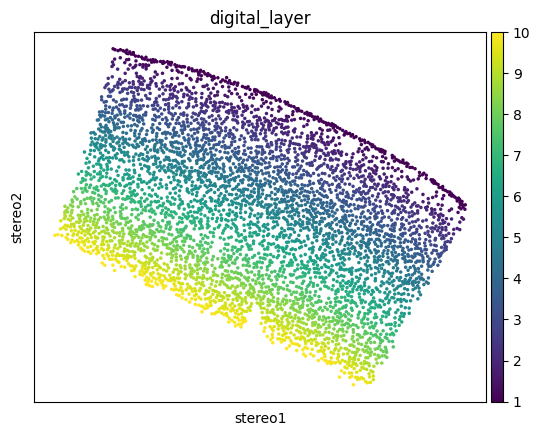

In [26]:
sc.pl.embedding(adata, basis='stereo',color='digital_layer')

In [27]:
adata.write_h5ad('F:/spatial/V1_integration/spatial_tranfer_digital_layer_30.h5ad')

In [25]:
adata_it =adata[adata.obs['Subclass_transfer']!='Astro'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Microglia'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='OPC'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Oligo'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Pvalb'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Sst'] 
adata_it =adata_it[adata_it.obs['Subclass_transfer']!='Vip'] 


In [312]:
adata_it.obs

,orig.ident,nCount_Spatial,nFeature_Spatial,area,coor_x,coor_y,areaL1,coor_x_ad,coor_y_ad,left_right,areaL2,ident,integration_partition_transfer,integration_partition_confidence,Subclass_transfer,Subclass_confidence,Type_transfer,Type_confidence,digital_layer
72918,Spatial,950.0,593,VISp-L6,11944,8694,V1,10153.110649,11919.971270,right,Cortex,region,p108,0.962379,L6 CT CTX,1.0,L6 CT CTX 0,0.427081,8.047032
72920,Spatial,190.0,138,VISp-L6,11953,8618,V1,10168.700238,11994.897665,right,Cortex,region,p108,0.629800,L6 CT CTX,1.0,L6 CT CTX 1,0.552629,7.796541
72925,Spatial,1034.0,636,VISp-L6,11992,8682,V1,10201.973864,11927.742130,right,Cortex,region,p108,0.595331,L6 CT CTX,1.0,L6 CT CTX 1,0.725270,7.948440
72941,Spatial,950.0,560,VISp-L6,11882,8947,V1,10069.296175,11673.337667,right,Cortex,region,p108,0.427806,L6 CT CTX,1.0,L6 CT CTX 1,0.568163,9.544692
72943,Spatial,1186.0,582,VISp-L6,11884,8866,V1,10078.348179,11753.855126,right,Cortex,region,p108,0.945906,L6 CT CTX,1.0,L6 CT CTX 0,0.871735,9.023323
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100274,Spatial,442.0,314,VISp-L1,15467,8473,V1,13681.965990,11833.080616,right,Cortex,region,p92,0.569711,L5 ET CTX,1.0,L5 ET CTX 0,0.545002,1.877519
100283,Spatial,665.0,365,VISp-L1,15524,8464,V1,13739.533489,11837.078491,right,Cortex,region,p92,0.436362,L5 ET CTX,1.0,L5 ET CTX 2,0.447592,1.765804
100300,Spatial,523.0,340,VISp-L23,15612,8591,V1,13816.129843,11702.892059,right,Cortex,region,p92,0.755839,L5 ET CTX,1.0,L5 ET CTX 0,0.412312,1.877361
100305,Spatial,340.0,250,VISp-L4,15396,8948,V1,13569.837188,11366.076192,right,Cortex,region,p92,0.999795,L5 ET CTX,1.0,L5 ET CTX 2,0.478671,3.696237


In [26]:
adata_l23 = adata[adata.obs['Subclass_transfer']=='L2/3 IT CTX']

/root/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.


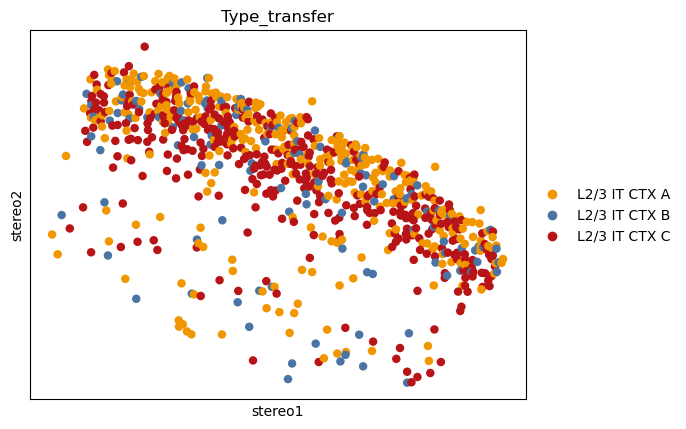

In [332]:
sc.pl.embedding(adata_l23,basis='stereo',color=['Type_transfer'],groups=['L2/3 IT CTX A','L2/3 IT CTX B','L2/3 IT CTX C'],palette=["#f29600","#4974a4","#b81316"])

(0.0, 5.5)

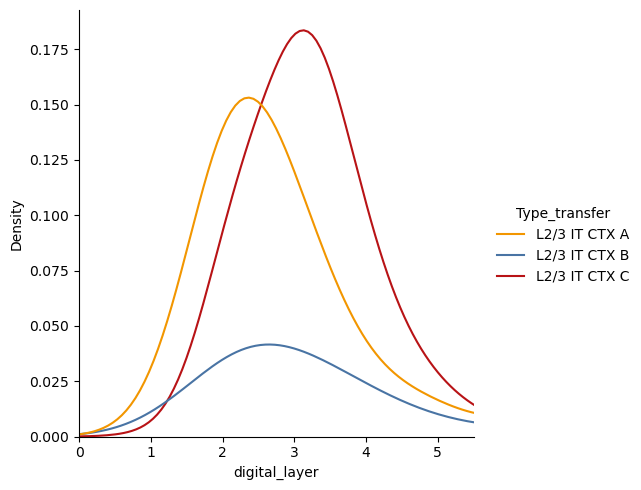

In [338]:
sns.displot(data=adata_l23.obs, x="digital_layer",hue="Type_transfer",kind='kde',palette=["#f29600","#4974a4","#b81316"])
plt.xlim(0,5.5)

In [229]:
adata_density

,orig.ident,nCount_Spatial,nFeature_Spatial,area,coor_x,coor_y,areaL1,coor_x_ad,coor_y_ad,left_right,areaL2,ident,integration_partition_transfer,integration_partition_confidence,Subclass_transfer,Subclass_confidence,Type_transfer,Type_confidence
72918,Spatial,950.0,593,VISp-L6,11944,8694,V1,10153.110649,11919.971270,right,Cortex,region,p108,0.962379,L6 CT CTX,1.0,L6 CT CTX 0,0.427081
72920,Spatial,190.0,138,VISp-L6,11953,8618,V1,10168.700238,11994.897665,right,Cortex,region,p108,0.629800,L6 CT CTX,1.0,L6 CT CTX 1,0.552629
72925,Spatial,1034.0,636,VISp-L6,11992,8682,V1,10201.973864,11927.742130,right,Cortex,region,p108,0.595331,L6 CT CTX,1.0,L6 CT CTX 1,0.725270
72941,Spatial,950.0,560,VISp-L6,11882,8947,V1,10069.296175,11673.337667,right,Cortex,region,p108,0.427806,L6 CT CTX,1.0,L6 CT CTX 1,0.568163
72943,Spatial,1186.0,582,VISp-L6,11884,8866,V1,10078.348179,11753.855126,right,Cortex,region,p108,0.945906,L6 CT CTX,1.0,L6 CT CTX 0,0.871735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100274,Spatial,442.0,314,VISp-L1,15467,8473,V1,13681.965990,11833.080616,right,Cortex,region,p92,0.569711,L5 ET CTX,1.0,L5 ET CTX 0,0.545002
100283,Spatial,665.0,365,VISp-L1,15524,8464,V1,13739.533489,11837.078491,right,Cortex,region,p92,0.436362,L5 ET CTX,1.0,L5 ET CTX 2,0.447592
100300,Spatial,523.0,340,VISp-L23,15612,8591,V1,13816.129843,11702.892059,right,Cortex,region,p92,0.755839,L5 ET CTX,1.0,L5 ET CTX 0,0.412312
100305,Spatial,340.0,250,VISp-L4,15396,8948,V1,13569.837188,11366.076192,right,Cortex,region,p92,0.999795,L5 ET CTX,1.0,L5 ET CTX 2,0.478671


In [234]:
from plotnine import *

In [165]:
import scanpy as sc

In [167]:
sc.pp.log1p(adata)
sc.tl.rank_genes_groups(adata, groupby='Subclass_transfer',groups=['L6b CTX'], reference='rest',method='t-test')

In [168]:
top_marker_genes = adata.uns['rank_genes_groups']['names']['L6b CTX'][:10]  # 取前 10 个 marker 基因
print("Top 10 marker genes for L6b:", top_marker_genes)

Top 10 marker genes for L6b: ['Pcp4' 'Snca' 'Rprm' 'Ttc9b' 'Ndufa4' 'Gh' '3110035E14Rik' 'Cox6a1'
 'Rap1gds1' 'Sept7']


In [ ]:
sc.pl.scatter(adata[adata.obs['modality'] == 'spatial'], x='coor_x', y='coor_y', color='GeneA', title='空间组 GeneA 表达')

In [177]:
import scanpy as sc

In [244]:
adata.obs['Type_transfer']

72918     L6 CT CTX 0
72920     L6 CT CTX 1
72925     L6 CT CTX 1
72941     L6 CT CTX 1
72943     L6 CT CTX 0
             ...     
100274    L5 ET CTX 0
100283    L5 ET CTX 2
100300    L5 ET CTX 0
100305    L5 ET CTX 2
100346    L5 ET CTX 1
Name: Type_transfer, Length: 4731, dtype: category
Categories (28, object): ['Astro', 'L2/3 IT CTX A', 'L2/3 IT CTX B', 'L2/3 IT CTX C', ..., 'Sst 0', 'Sst 1', 'Sst 2', 'Vip']

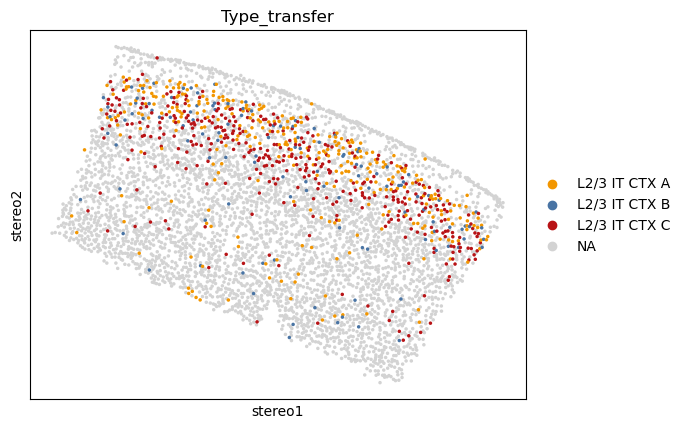

In [333]:
sc.pl.embedding(adata,basis='stereo',color=['Type_transfer'],groups=['L2/3 IT CTX A','L2/3 IT CTX B','L2/3 IT CTX C'],palette=["#b81316","#f29600","#4974a4"])

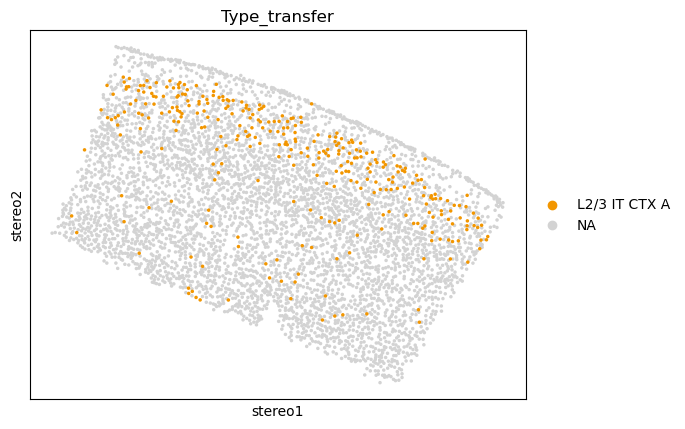

In [334]:
sc.pl.embedding(adata,basis='stereo',color=['Type_transfer'],groups=['L2/3 IT CTX A'])

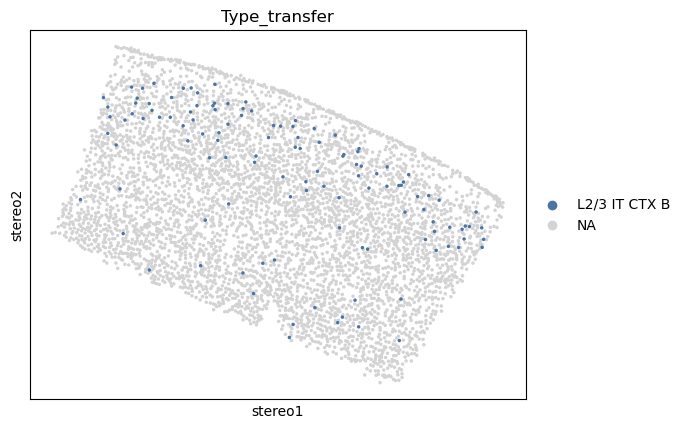

In [335]:
sc.pl.embedding(adata,basis='stereo',color=['Type_transfer'],groups=['L2/3 IT CTX B'])

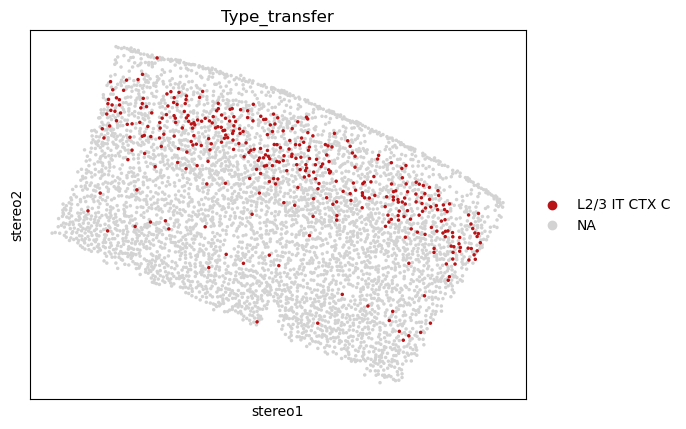

In [336]:
sc.pl.embedding(adata,basis='stereo',color=['Type_transfer'],groups=['L2/3 IT CTX C'])

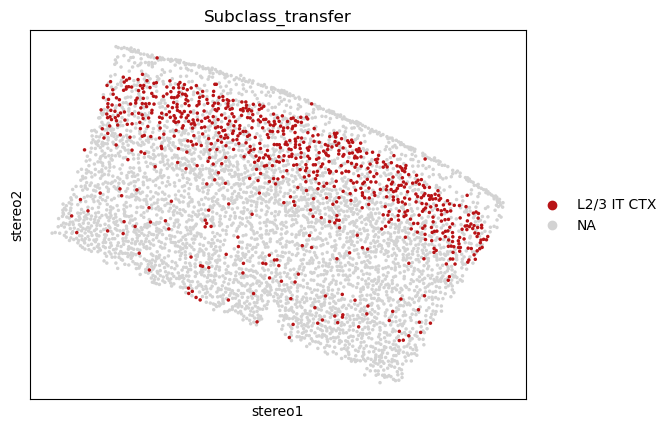

View of AnnData object with n_obs × n_vars = 805 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


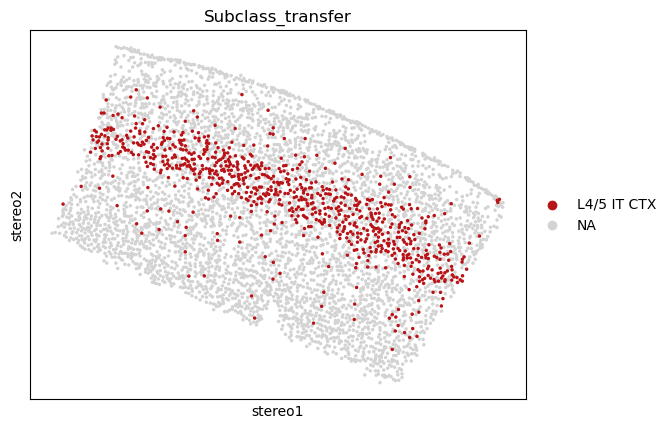

View of AnnData object with n_obs × n_vars = 779 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


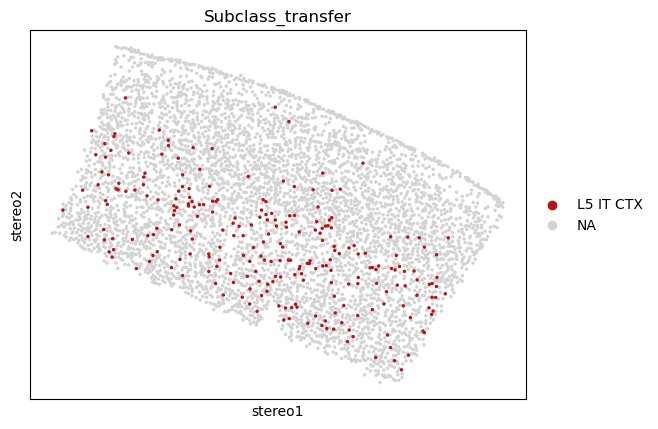

View of AnnData object with n_obs × n_vars = 247 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


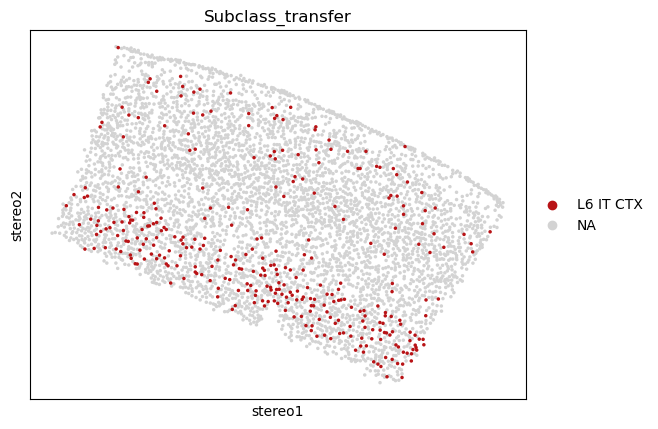

View of AnnData object with n_obs × n_vars = 329 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


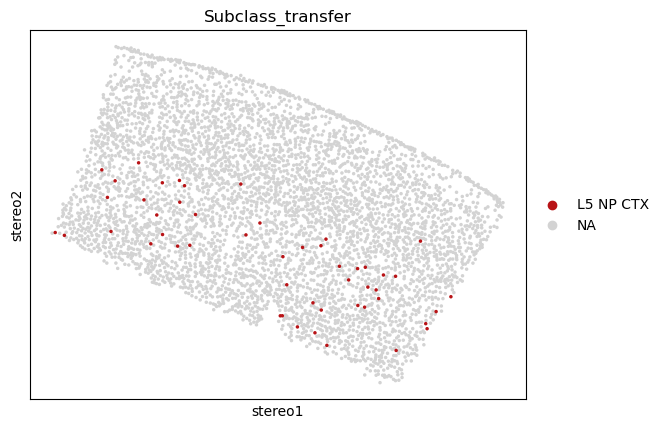

View of AnnData object with n_obs × n_vars = 50 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


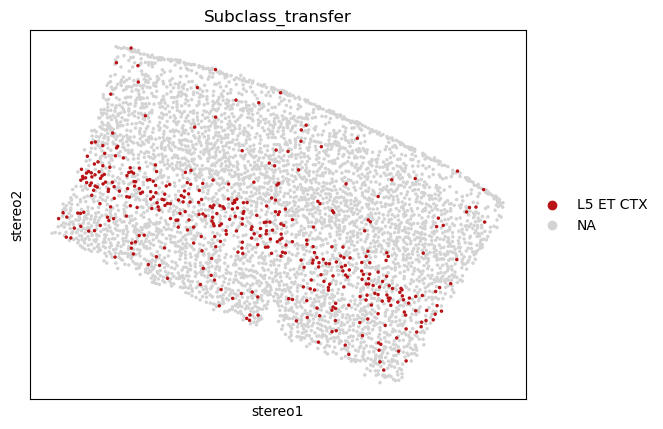

View of AnnData object with n_obs × n_vars = 412 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


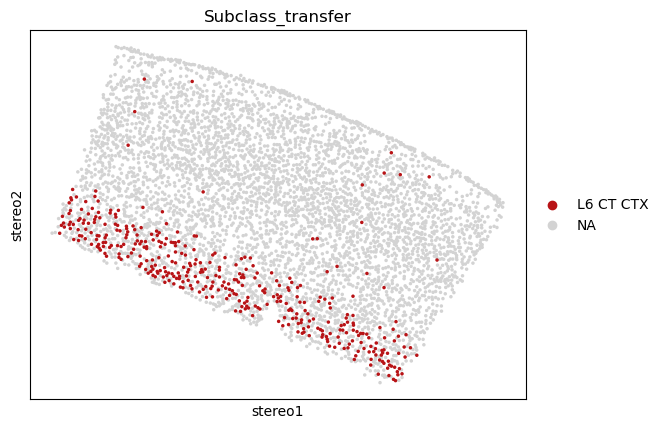

View of AnnData object with n_obs × n_vars = 387 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


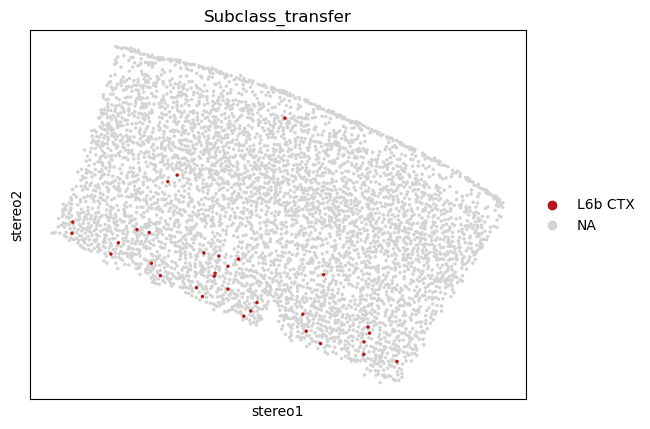

View of AnnData object with n_obs × n_vars = 32 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


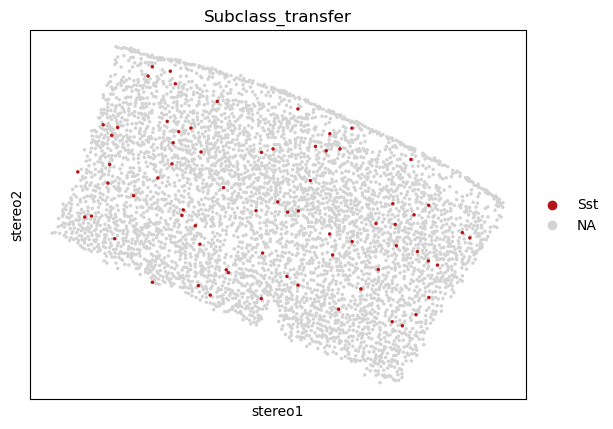

View of AnnData object with n_obs × n_vars = 71 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


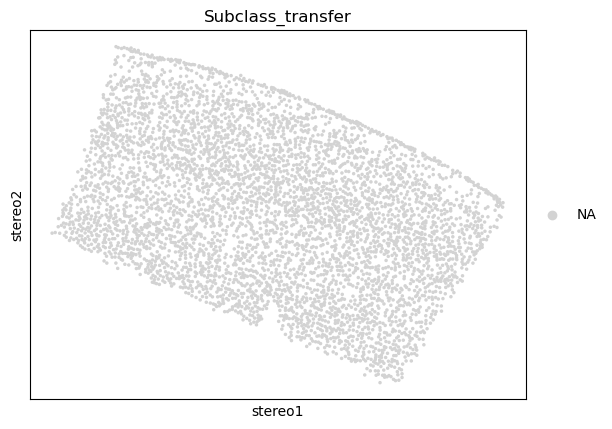

View of AnnData object with n_obs × n_vars = 0 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


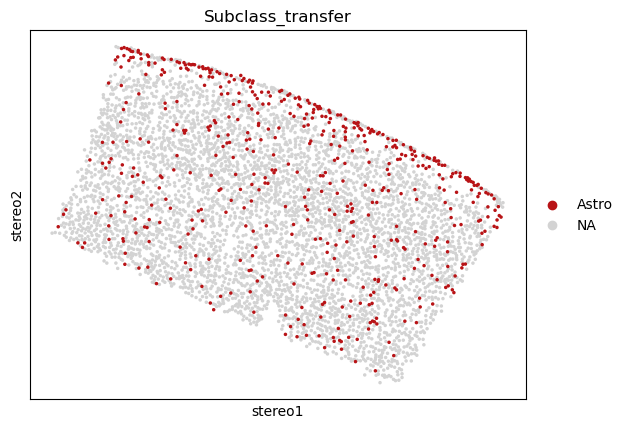

View of AnnData object with n_obs × n_vars = 518 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


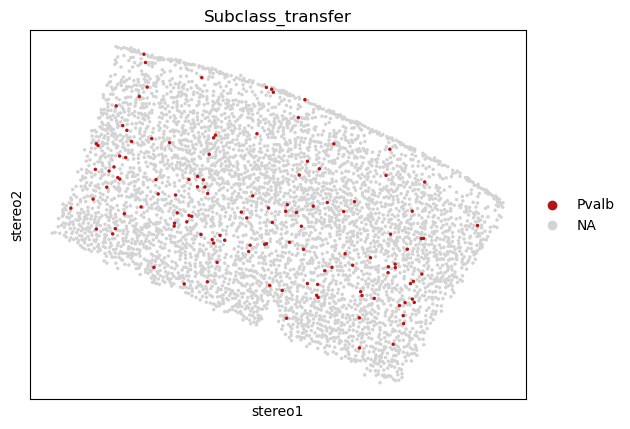

View of AnnData object with n_obs × n_vars = 124 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


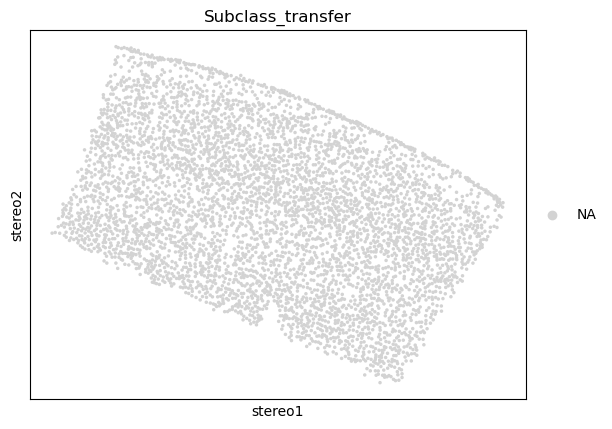

View of AnnData object with n_obs × n_vars = 0 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


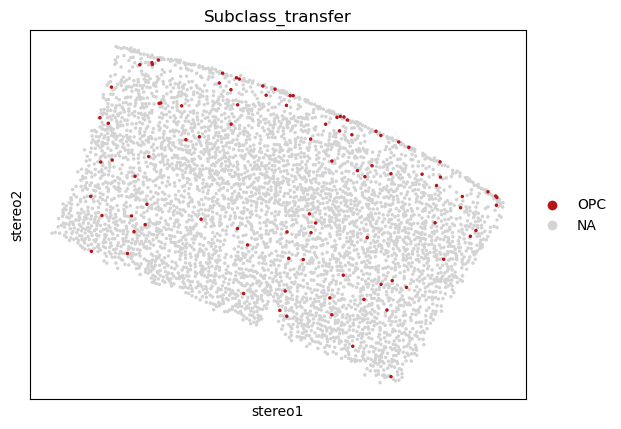

View of AnnData object with n_obs × n_vars = 92 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


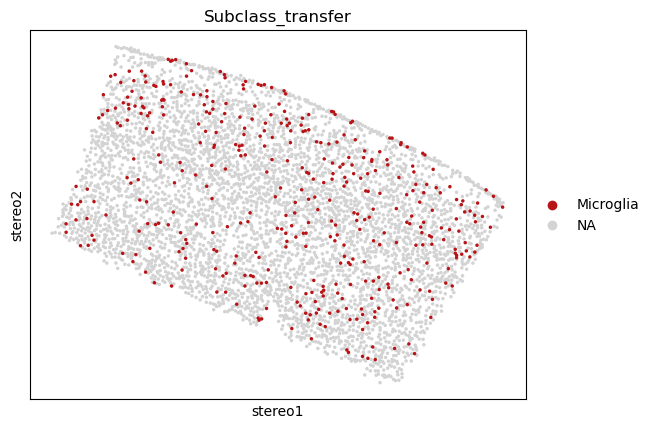

View of AnnData object with n_obs × n_vars = 405 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


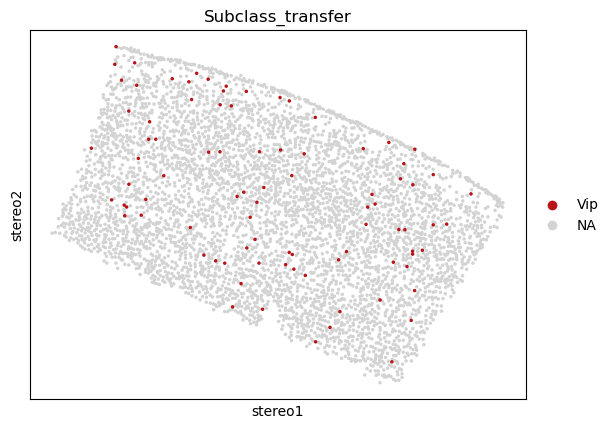

View of AnnData object with n_obs × n_vars = 88 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


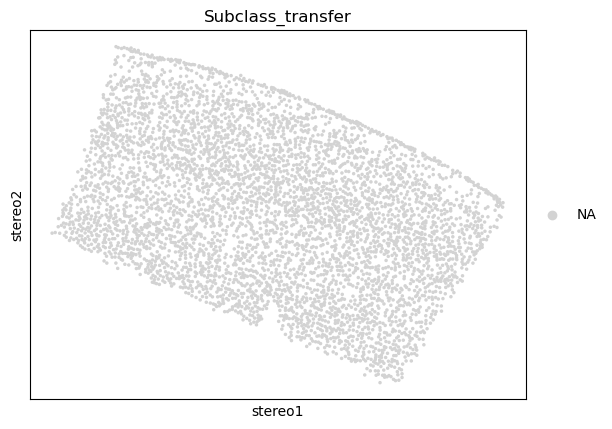

View of AnnData object with n_obs × n_vars = 0 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


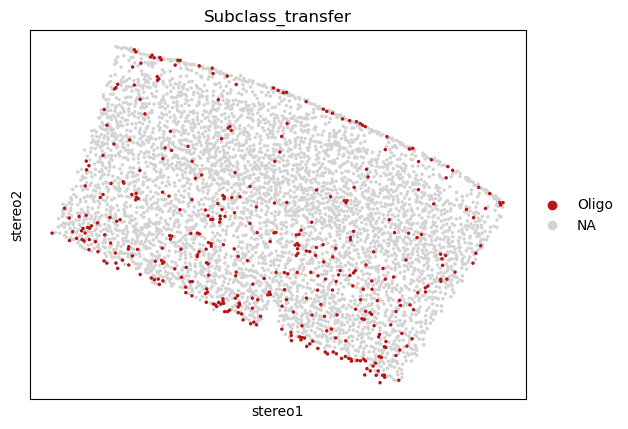

View of AnnData object with n_obs × n_vars = 392 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    uns: 'rank_genes_groups', 'log1p', 'Subclass_transfer_colors'
    obsm: 'stereo'
    layers: 'imputed'


In [178]:
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['L2/3 IT CTX'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='L2/3 IT CTX'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['L4/5 IT CTX'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='L4/5 IT CTX'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['L5 IT CTX'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='L5 IT CTX'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['L6 IT CTX'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='L6 IT CTX'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['L5 NP CTX'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='L5 NP CTX'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['L5 ET CTX'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='L5 ET CTX'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['L6 CT CTX'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='L6 CT CTX'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['L6b CTX'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='L6b CTX'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['Sst'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='Sst'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['ABC'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='ABC'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['Astro'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='Astro'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['Pvalb'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='Pvalb'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['VLMC'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='VLMC'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['OPC'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='OPC'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['Microglia'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='Microglia'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['Vip'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='Vip'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['Lamp5'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='Lamp5'])
sc.pl.embedding(adata,basis='stereo',color=['Subclass_transfer'],groups=['Oligo'],palette=["#b81316"])
print(adata[adata.obs['Subclass_transfer']=='Oligo'])

In [ ]:
p108, 1597, ['L6 CT CTX']
p124, 1025, ['Oligo']
p155, 3044, ['L4/5 IT CTX']
p186, 631, ['L5 IT CTX']
p201, 860, ['L6 IT CTX']
p205, 213, ['Microglia']
p209, 279, ['OPC']
p217, 674, ['Astro']
p225, 307, ['Lamp5']
p229, 632, ['Sst']
p233, 238, ['L5 NP CTX']
p237, 420, ['Vip']
p239, 207, ['L6b CTX']
p240, 34, ['ABC']
p241, 16, ['VLMC']
p249, 553, ['Pvalb']
p61, 3376, ['L2/3 IT CTX']
p92, 1459, ['L5 ET CTX']

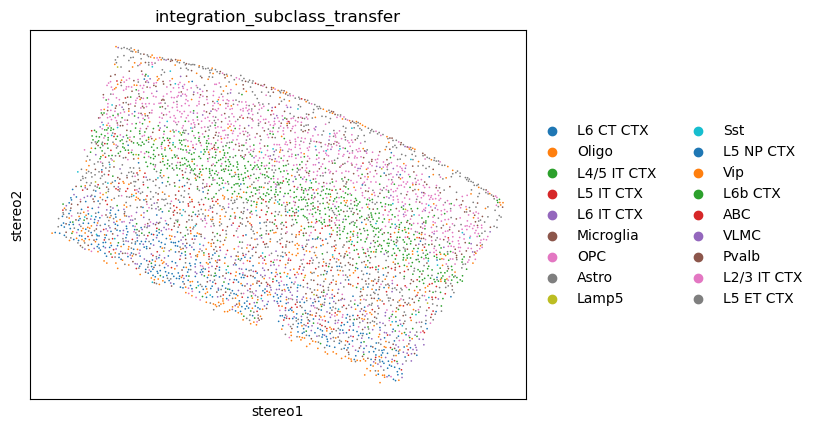

In [86]:
import matplotlib.colors as mcolors

# 使用 CSS4 颜色
css4_palette = list(mcolors.CSS4_COLORS.values())

# 使用 Tableau 颜色
tableau_palette = list(mcolors.TABLEAU_COLORS.values())

# 在绘图时使用

sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],palette=tableau_palette)

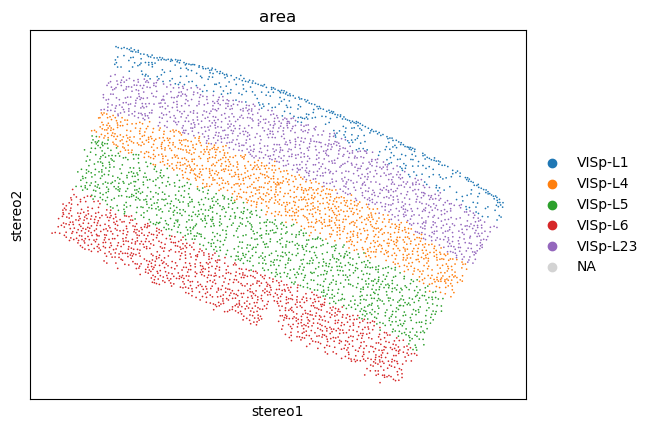

In [59]:
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['area'])

In [333]:
NR_V1_merge.obs['integration_subclass_transfer']

AAACCCAAGTACTGTC-1-V1_N1          Pvalb
AAACCCAAGTTGGAAT-1-V1_N1      L5 IT CTX
AAACCCACAGAAATTG-1-V1_N1          Astro
AAACCCACATACCAGT-1-V1_N1    L4/5 IT CTX
AAACCCAGTCTACATG-1-V1_N1      L5 ET CTX
                               ...     
101978                            Astro
101979                            Astro
101994                      L2/3 IT CTX
101999                      L2/3 IT CTX
102000                      L2/3 IT CTX
Name: integration_subclass_transfer, Length: 20329, dtype: category
Categories (18, object): ['L4/5 IT CTX', 'L6 CT CTX', 'L5 ET CTX', 'Astro', ..., 'Lamp5', 'L5 NP CTX', 'L2/3 IT CTX', 'Oligo']

In [ ]:
#: pc =8, L23 :4126; pc=10, L23:4233;pc =8, L23 :4126; pc=10, L4/5:3854; pc=8 L45: 3776

In [44]:
NR_V1_spatial = NR_V1_merge[NR_V1_merge.obs['modality']=='spatial']

In [364]:
NR_V1_spatial

View of AnnData object with n_obs × n_vars = 4764 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'modality', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_tr

In [43]:
NR_V1_merge=sc.read_h5ad('NR_V1_merge_11.h5ad')

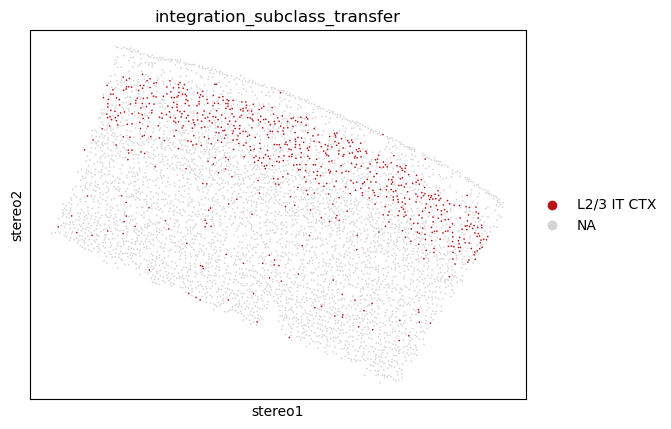

View of AnnData object with n_obs × n_vars = 761 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass

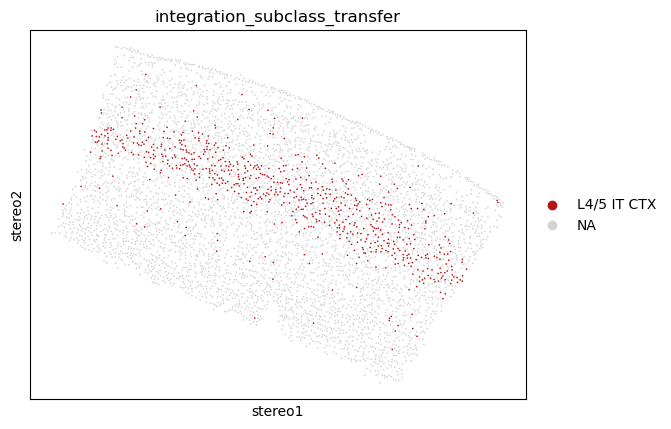

View of AnnData object with n_obs × n_vars = 723 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass

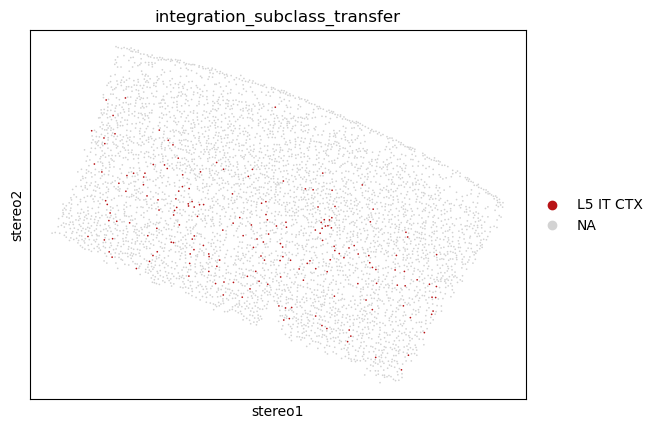

View of AnnData object with n_obs × n_vars = 190 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass

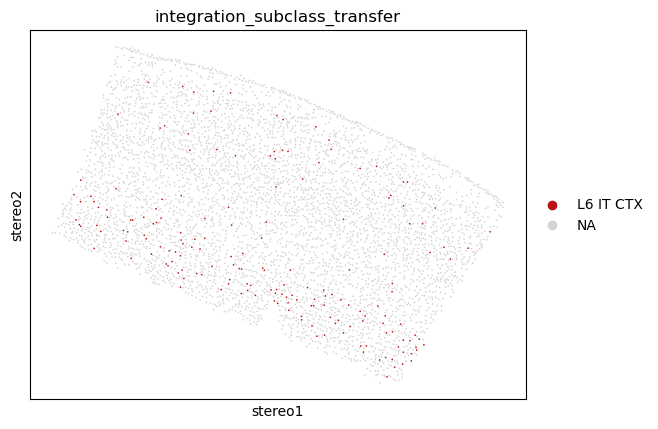

View of AnnData object with n_obs × n_vars = 181 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass

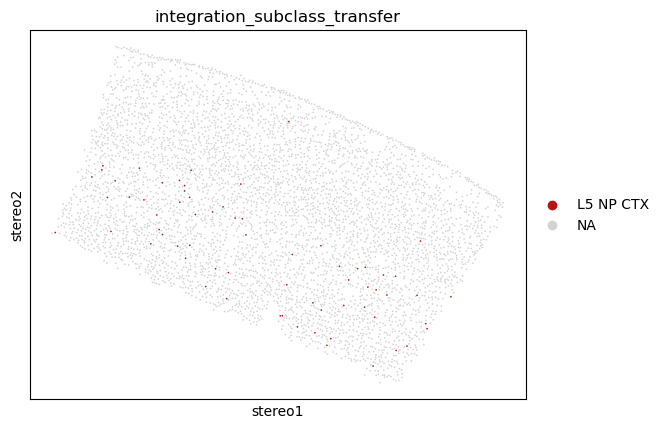

View of AnnData object with n_obs × n_vars = 67 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass_

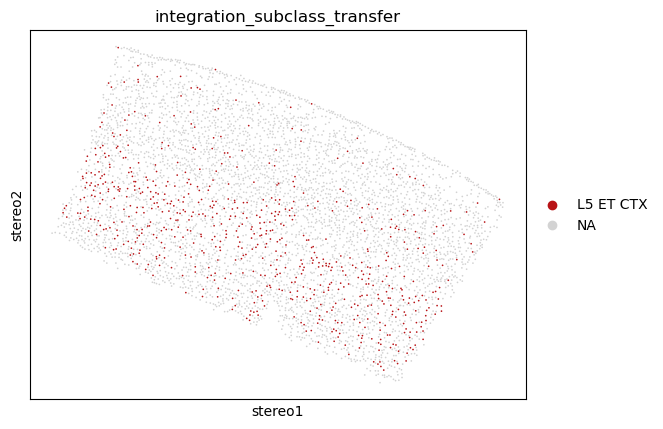

View of AnnData object with n_obs × n_vars = 691 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass

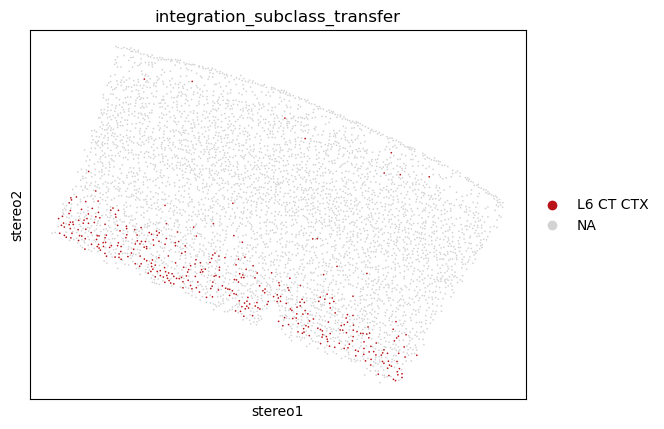

View of AnnData object with n_obs × n_vars = 384 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass

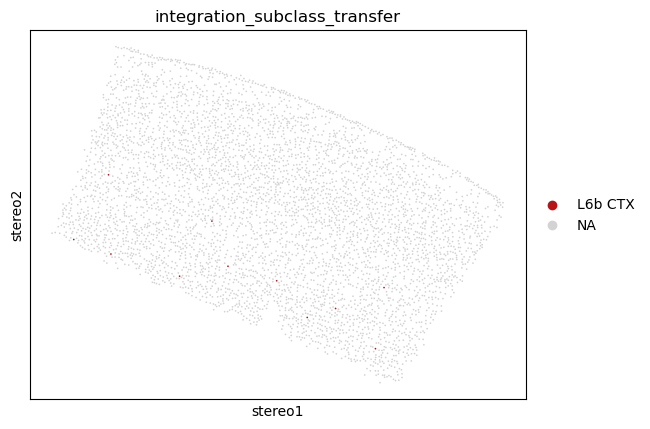

View of AnnData object with n_obs × n_vars = 11 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass_

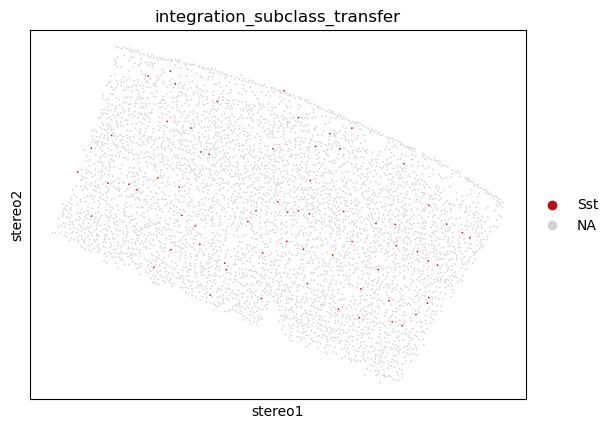

View of AnnData object with n_obs × n_vars = 68 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass_

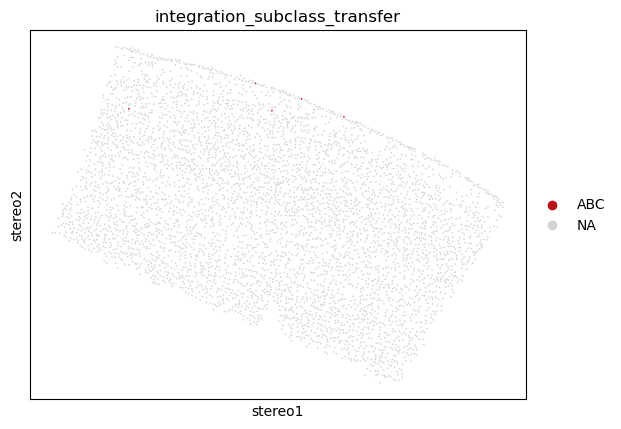

View of AnnData object with n_obs × n_vars = 5 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass_t

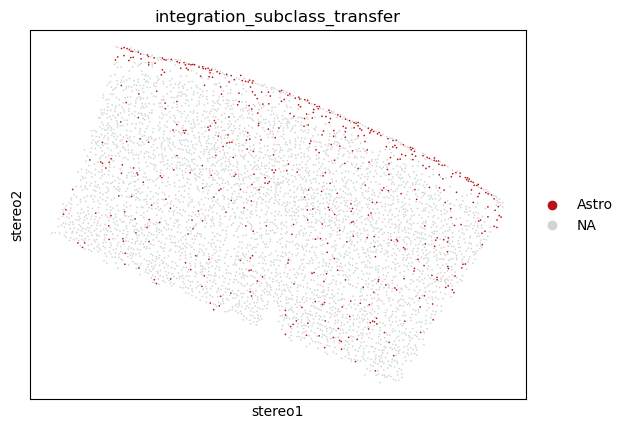

View of AnnData object with n_obs × n_vars = 523 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass

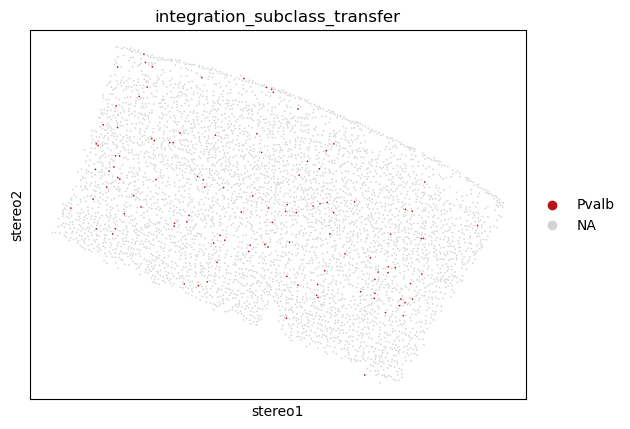

View of AnnData object with n_obs × n_vars = 113 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass

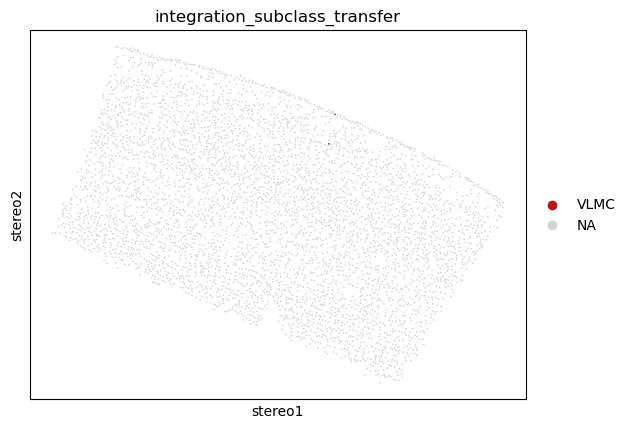

View of AnnData object with n_obs × n_vars = 2 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass_t

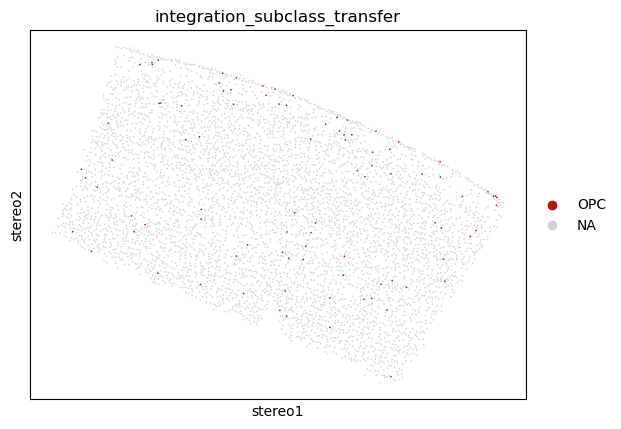

View of AnnData object with n_obs × n_vars = 91 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass_

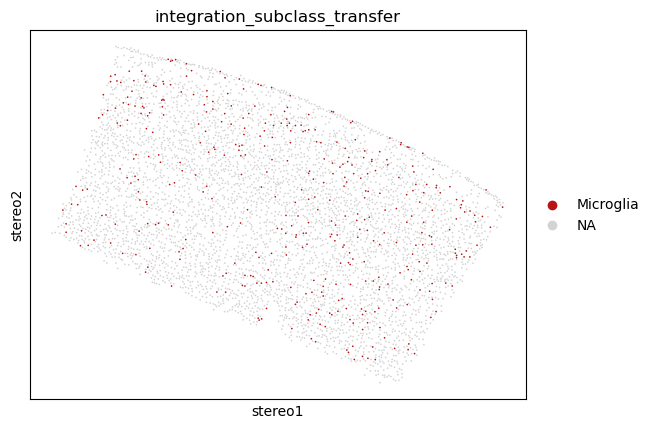

View of AnnData object with n_obs × n_vars = 411 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass

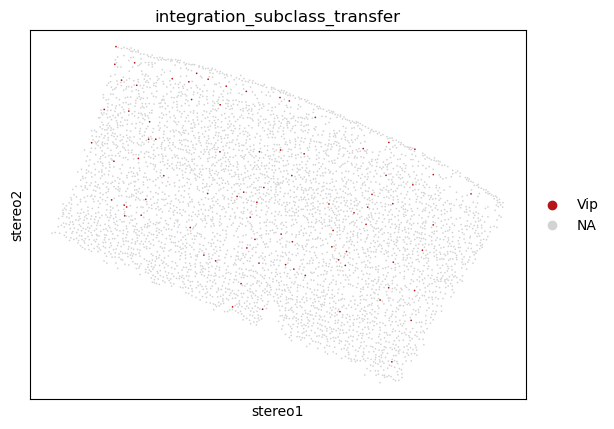

View of AnnData object with n_obs × n_vars = 83 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass_

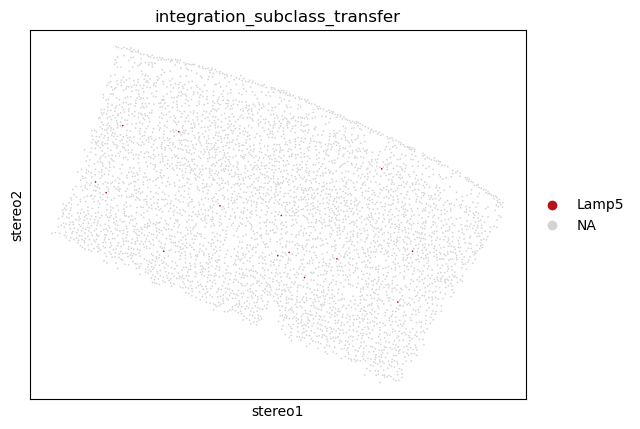

View of AnnData object with n_obs × n_vars = 14 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass_

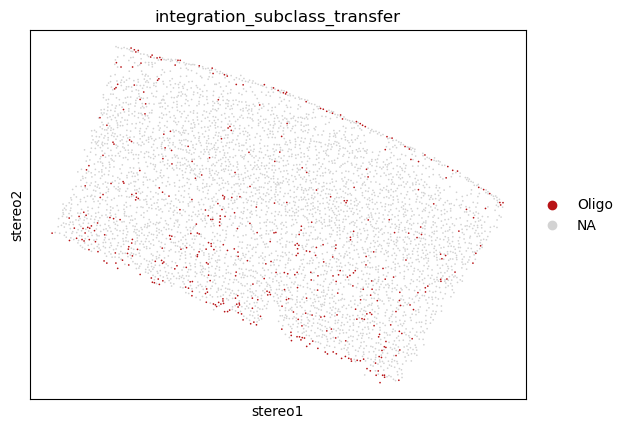

View of AnnData object with n_obs × n_vars = 446 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: 'gene_ids-seq', 'feature_types-seq', 'n_cells-V1_N1-seq', 'highly_variable-V1_N1-seq', 'means-V1_N1-seq', 'dispersions-V1_N1-seq', 'dispersions_norm-V1_N1-seq', 'n_cells-V1_N2-seq', 'highly_variable-V1_N2-seq', 'means-V1_N2-seq', 'dispersions-V1_N2-seq', 'dispersions_norm-V1_N2-seq', 'highly_variable-seq', 'means-seq', 'dispersions-seq', 'dispersions_norm-seq', 'mean-seq', 'std-seq', 'gene-spatial'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors', 'integration_subclass

In [42]:
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L2/3 IT CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L2/3 IT CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L4/5 IT CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L4/5 IT CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L5 IT CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L5 IT CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L6 IT CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L6 IT CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L5 NP CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L5 NP CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L5 ET CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L5 ET CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L6 CT CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L6 CT CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L6b CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L6b CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Sst'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Sst'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['ABC'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='ABC'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Astro'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Astro'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Pvalb'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Pvalb'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['VLMC'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='VLMC'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['OPC'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='OPC'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Microglia'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Microglia'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Vip'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Vip'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Lamp5'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Lamp5'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Oligo'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Oligo'])

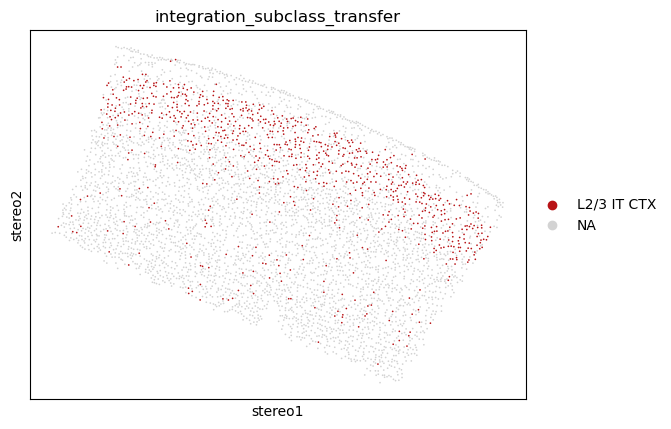

View of AnnData object with n_obs × n_vars = 882 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


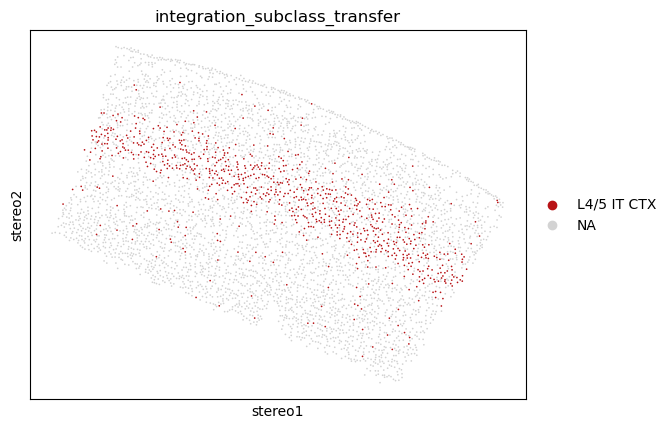

View of AnnData object with n_obs × n_vars = 842 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


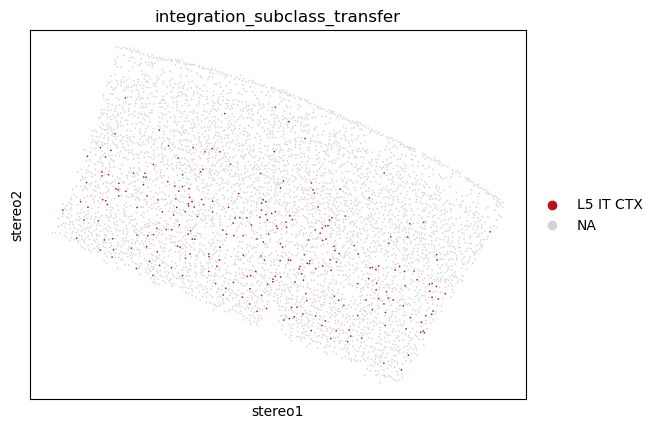

View of AnnData object with n_obs × n_vars = 273 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


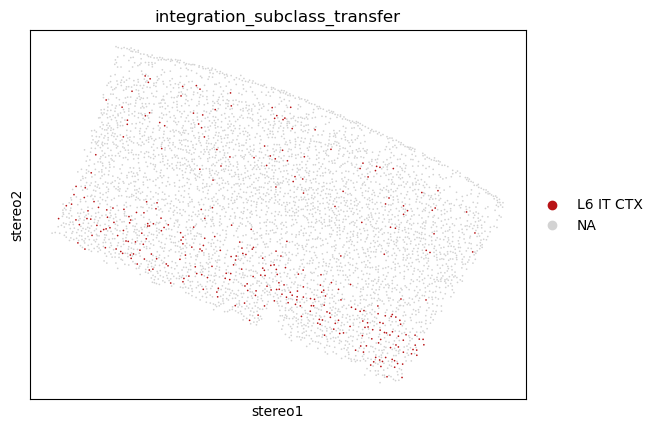

View of AnnData object with n_obs × n_vars = 335 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


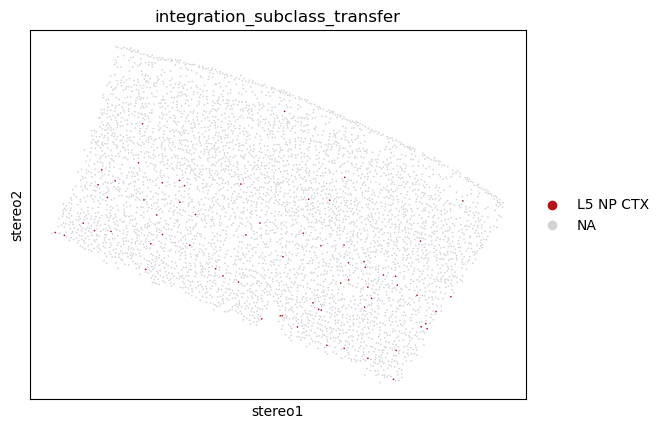

View of AnnData object with n_obs × n_vars = 67 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


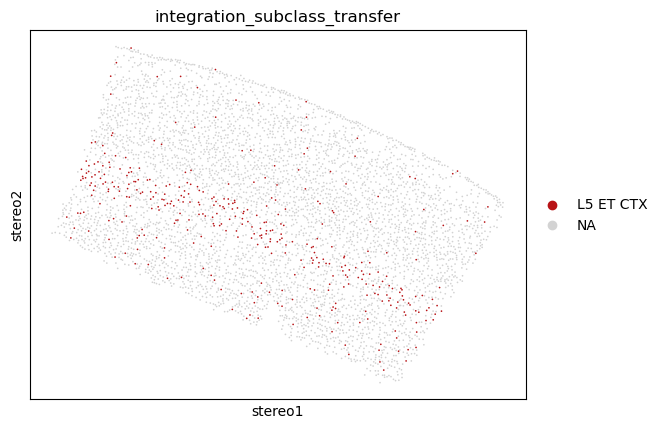

View of AnnData object with n_obs × n_vars = 378 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


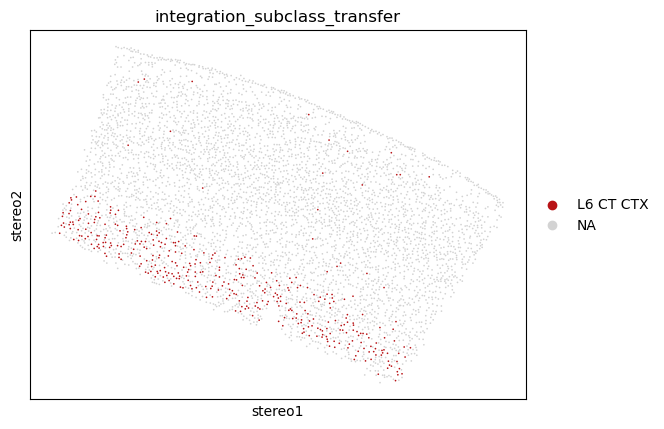

View of AnnData object with n_obs × n_vars = 394 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


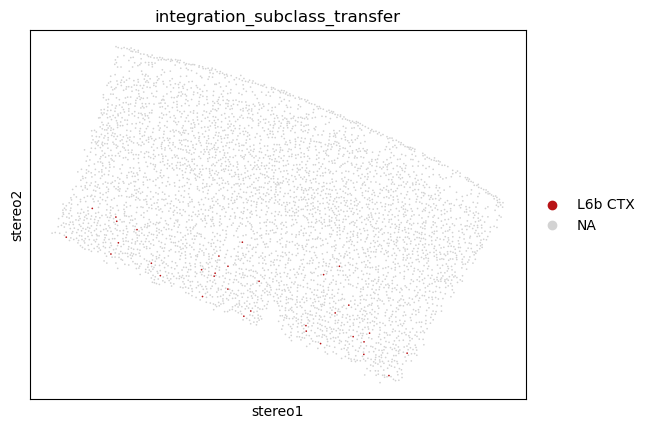

View of AnnData object with n_obs × n_vars = 33 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


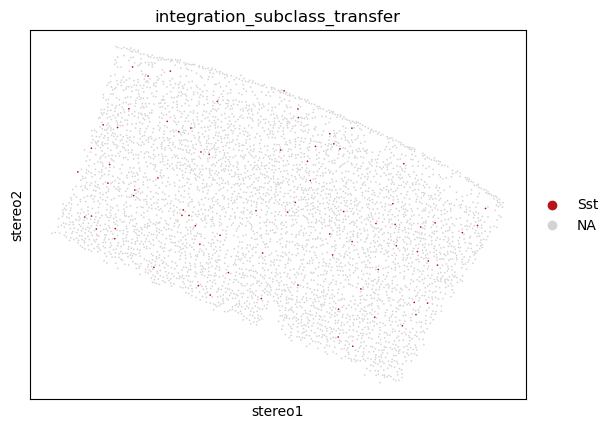

View of AnnData object with n_obs × n_vars = 78 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


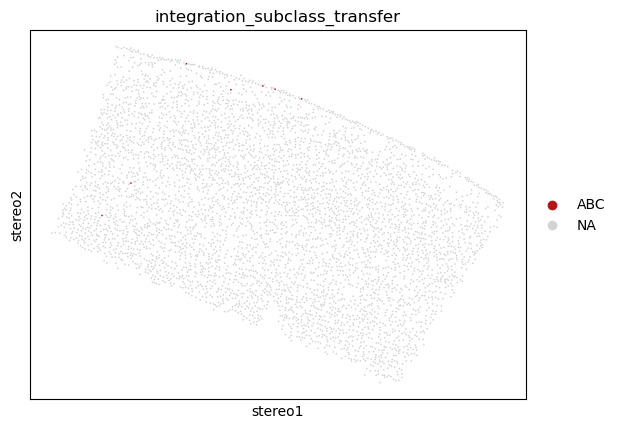

View of AnnData object with n_obs × n_vars = 8 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


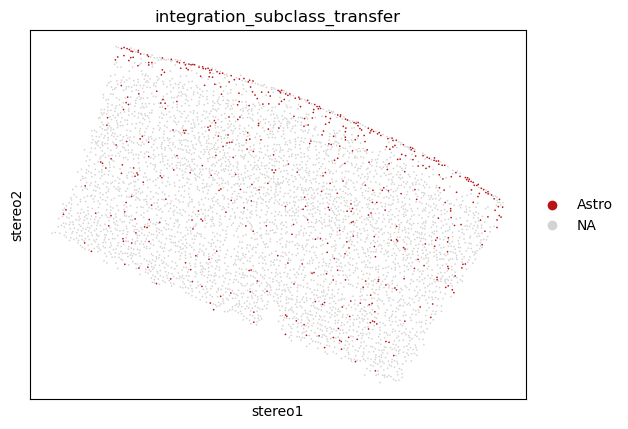

View of AnnData object with n_obs × n_vars = 510 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


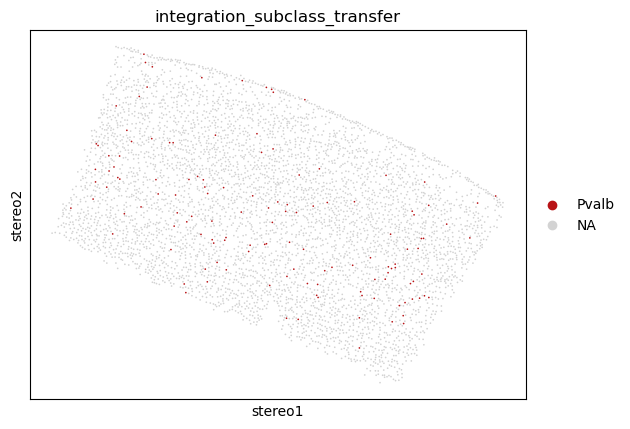

View of AnnData object with n_obs × n_vars = 134 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


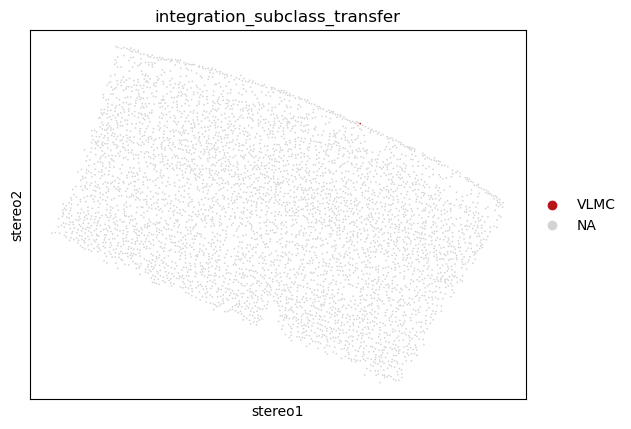

View of AnnData object with n_obs × n_vars = 1 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


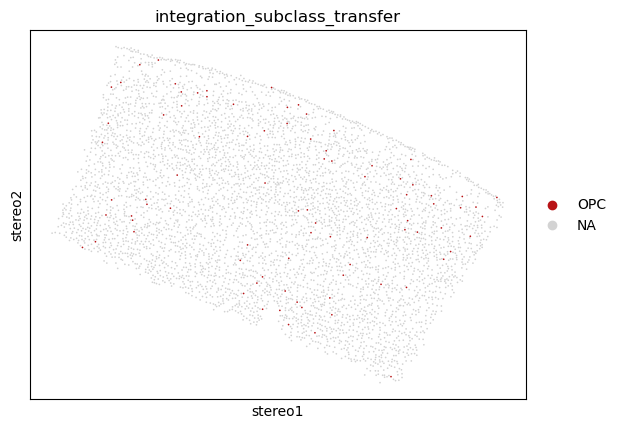

View of AnnData object with n_obs × n_vars = 85 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


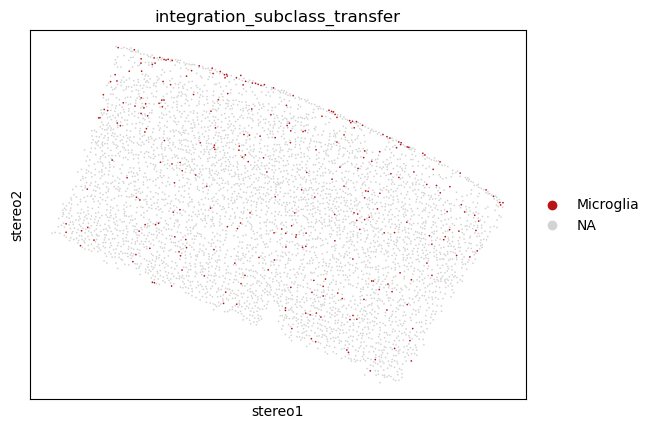

View of AnnData object with n_obs × n_vars = 276 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


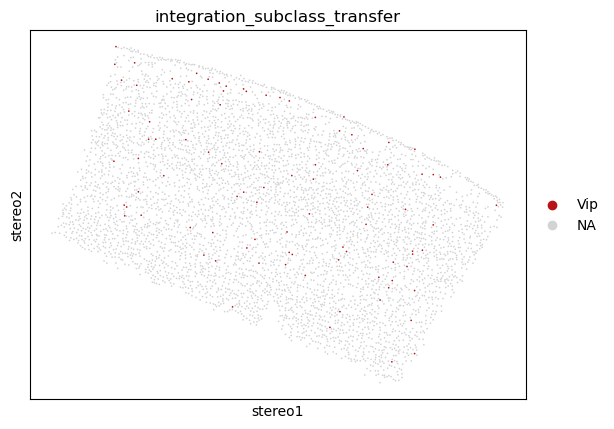

View of AnnData object with n_obs × n_vars = 91 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


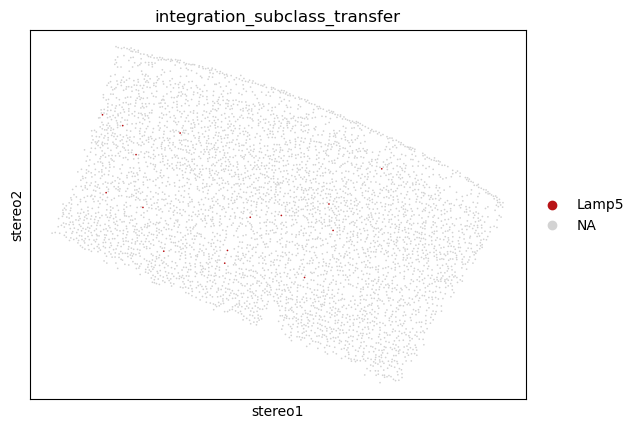

View of AnnData object with n_obs × n_vars = 15 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


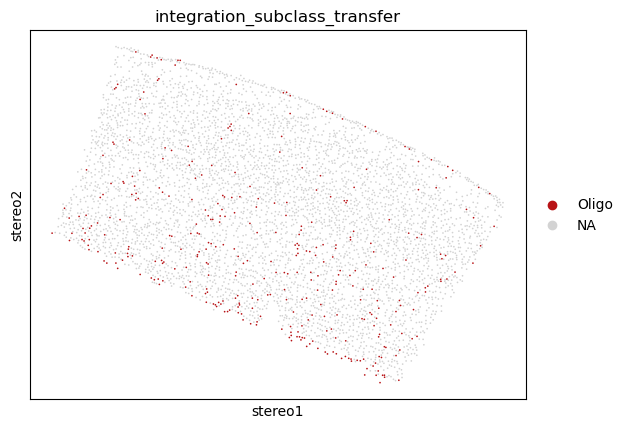

View of AnnData object with n_obs × n_vars = 362 × 27498
    obs: 'n_genes', 'n_counts', 'doublet_score', 'Class', 'preclass', 'cluster', 'Subclass', 'Sample', 'Type', 'Subtype', 'Cell_annotation', 'integration_partition', 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'modality', 'integration_partition_transfer', 'integration_subclass_transfer'
    var: '_index', 'feature_types-seq', 'gene_ids-seq', 'highly_variable-V1_N1-seq', 'n_cells-V1_N1-seq'
    uns: 'pca', 'neighbors', 'paga', 'integration_partition_transfer_sizes', 'integration_partition_transfer_colors'
    obsm: 'X_pca', 'X_pca_integrate'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


In [72]:
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L2/3 IT CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L2/3 IT CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L4/5 IT CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L4/5 IT CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L5 IT CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L5 IT CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L6 IT CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L6 IT CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L5 NP CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L5 NP CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L5 ET CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L5 ET CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L6 CT CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L6 CT CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['L6b CTX'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='L6b CTX'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Sst'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Sst'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['ABC'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='ABC'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Astro'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Astro'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Pvalb'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Pvalb'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['VLMC'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='VLMC'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['OPC'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='OPC'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Microglia'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Microglia'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Vip'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Vip'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Lamp5'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Lamp5'])
sc.pl.embedding(NR_V1_merge,basis='stereo',color=['integration_subclass_transfer'],groups=['Oligo'],palette=["#b81316"])
print(NR_V1_spatial[NR_V1_spatial.obs['integration_subclass_transfer']=='Oligo'])

In [ ]:
#RNA velocity

In [4]:
adata=sc.read_h5ad('F:/spatial/V1_integration/spatial_tranfer_30.h5ad')

In [28]:
adata_itl23= adata[adata.obs['Subclass_transfer']=='L2/3 IT CTX']

In [29]:
adata_l23 = adata_itl23[adata_itl23.obs['digital_layer'].between(1, 5.5)]

In [31]:
N_V1_L23_PC_index = N_V1_L23_PCgene.index.astype(str)

In [38]:
adata_l23_index =adata_l23.var.index.astype(str)

In [39]:
common_index  =N_V1_L23_PC_index.intersection(adata_l23_index)

In [41]:
common_index

Index(['Arl6ip6', 'Gm46124', 'Msc', 'Fgfr1', 'Gm42775', 'Gm43458', 'Sap30l',
       'Tll1', 'Cyb561a3', 'Dkk2',
       ...
       'Cdh12', 'Rfx3', 'Robo1', 'Kirrel3', 'Cdh13', 'Sorcs3', 'Cntn5',
       'Epha6', 'Egfem1', 'Etl4'],
      dtype='object', length=866)

In [40]:
common = N_V1_L23_PCgene.loc[N_V1_L23_PCgene.index.intersection(common_index)]

In [42]:
common 

""
Arl6ip6
Gm46124
Msc
Fgfr1
Gm42775
...
Sorcs3
Cntn5
Epha6
Egfem1


In [5]:
adata

AnnData object with n_obs × n_vars = 4731 × 25556
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence'
    obsm: 'stereo'
    layers: 'imputed'

In [11]:
N_V1_L23_PCgene = pd.read_csv('F:/spatial/V1_integration/NR_V1_L23_PC1rank.csv',index_col='Gene')

In [12]:
N_V1_L23_PCgene

""
Gene
Arl6ip6
Gm44957
Gm46124
Msc
Fgfr1
...
Sorcs3
Cntn5
Epha6


In [ ]:
Lasso_N_L23 =N_L23[:,Lasso_gene.index] 

In [43]:
adata_l23_PC =adata_l23[:,common.index] 

In [44]:
adata_l23_PC

View of AnnData object with n_obs × n_vars = 717 × 866
    obs: 'orig.ident', 'nCount_Spatial', 'nFeature_Spatial', 'area', 'coor_x', 'coor_y', 'areaL1', 'coor_x_ad', 'coor_y_ad', 'left_right', 'areaL2', 'ident', 'integration_partition_transfer', 'integration_partition_confidence', 'Subclass_transfer', 'Subclass_confidence', 'Type_transfer', 'Type_confidence', 'digital_layer'
    obsm: 'stereo'
    layers: 'imputed'